# Cluster FICS

In [1]:
from dotenv import find_dotenv, load_dotenv
import os
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
from tslearn.clustering import TimeSeriesKMeans
import time
from sklearn import metrics
from tslearn.clustering import TimeSeriesKMeans
from tslearn.clustering import silhouette_score
import numpy as np
from warnings import filterwarnings
import pickle
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from tslearn.utils import to_time_series_dataset
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from src.data.fics_dataset import FICSDatasetBuilder
filterwarnings("ignore")



Variables

In [2]:
load_dotenv(find_dotenv())

PROJECT_PATH=os.getenv('PROJECT_PATH')
NUMBER_OF_GAMES_MINIMUM=int(os.getenv('NUMBER_OF_GAMES_MINIMUM'))
FICS_MIN_YEAR=int(os.getenv('FICS_MIN_YEAR'))
FICS_MAX_YEAR=int(os.getenv('FICS_MAX_YEAR'))



#### Methods

In [3]:
def get_samples(players_dict,offset,num_samples):
    samples={}
    for p in players_dict:
        try:
            v=players_dict[p]
            arr=list(v[(v.index<offset+num_samples)&(v.index>=offset)]["Elo"])
            samples[p]=arr
        except Exception as err:
            print(err)
            pass
        
    for p in list(samples.keys()):
        if len(samples[p])!=num_samples:
            del samples[p]

    
    return samples

def get_samples_ts(players_dict,offset,num_samples):
    samples={}
    for p in players_dict:
        try:
            v=players_dict[p]
            arr_Timestamp=(v[(v.index<offset+num_samples)&(v.index>=offset)]["Timestamp"])
            samples[p]=arr_Timestamp
        except Exception as err:
            print(err)
            pass
        
    for p in list(samples.keys()):
        if len(samples[p])!=num_samples:
            del samples[p]

    print(samples)
    return samples

def dp(dist_mat):
    """
    Find minimum-cost path through matrix `dist_mat` using dynamic programming.

    The cost of a path is defined as the sum of the matrix entries on that
    path. See the following for details of the algorithm:

    - http://en.wikipedia.org/wiki/Dynamic_time_warping
    - https://www.ee.columbia.edu/~dpwe/resources/matlab/dtw/dp.m

    The notation in the first reference was followed, while Dan Ellis's code
    (second reference) was used to check for correctness. Returns a list of
    path indices and the cost matrix.
    """

    N, M = dist_mat.shape

    # Initialize the cost matrix
    cost_mat = np.zeros((N + 1, M + 1))
    for i in range(1, N + 1):
        cost_mat[i, 0] = np.inf
    for i in range(1, M + 1):
        cost_mat[0, i] = np.inf

    # Fill the cost matrix while keeping traceback information
    traceback_mat = np.zeros((N, M))
    for i in range(N):
        for j in range(M):
            penalty = [
                cost_mat[i, j],      # match (0)
                cost_mat[i, j + 1],  # insertion (1)
                cost_mat[i + 1, j]]  # deletion (2)
            i_penalty = np.argmin(penalty)
            cost_mat[i + 1, j + 1] = dist_mat[i, j] + penalty[i_penalty]
            traceback_mat[i, j] = i_penalty

    # Traceback from bottom right
    i = N - 1
    j = M - 1
    path = [(i, j)]
    while i > 0 or j > 0:
        tb_type = traceback_mat[i, j]
        if tb_type == 0:
            # Match
            i = i - 1
            j = j - 1
        elif tb_type == 1:
            # Insertion
            i = i - 1
        elif tb_type == 2:
            # Deletion
            j = j - 1
        path.append((i, j))

    # Strip infinity edges from cost_mat before returning
    cost_mat = cost_mat[1:, 1:]
    return (path[::-1], cost_mat)


def kmeans_silhoutte(X_train,metric,max_k=10):
    silhoutte_score = []
    for i in range(2,max_k+1):
        start = time.time()
        model= TimeSeriesKMeans(n_clusters=i,metric=metric,n_jobs=-1,random_state=0)
        y_pred = model.fit_predict(X_train)
        score = silhouette_score(X_train, y_pred, metric=metric)
        silhoutte_score.append(score)
        stop = time.time()
        duration = stop - start
        print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")

    plt.figure(figsize=(20,max_k))
    plt.grid()
    plt.plot(range(2,10),silhoutte_score,marker='o',linestyle='--')
    plt.xlabel('number of clusters')
    plt.ylabel('silhoutte');
    plt.title("Silhouette analysis For Optimal K and Optimal Model")
    plt.savefig(f"{PROJECT_PATH}/reports/figures/fics/kmeans-Silhouette-plot-{metric}-{max_k}_v2.png")

    return silhoutte_score

def kmeans_calinski_harabasz(X_train,metric,model_name,max_k=10):
    scores = []
    for i in range(2,max_k+1):
        start = time.time()
        model= TimeSeriesKMeans(n_clusters=i,metric=metric,n_jobs=-1,random_state=0)
        y_pred = model.fit_predict(X_train)
        score = metrics.calinski_harabasz_score(X_train, y_pred)
        scores.append(score)
        stop = time.time()
        duration = stop - start
        print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")

    plt.figure(figsize=(20,max_k))
    plt.grid()
    plt.plot(range(2,max_k+1),scores,marker='o',linestyle='--')
    plt.xlabel('number of clusters')
    plt.ylabel('calinski harabasz');
    plt.title("calinski harabasz For Optimal K and Optimal Model")
    plt.savefig(f"{PROJECT_PATH}/reports/figures/fics/kmeans-calinski-harabasz-plot-{model_name}_v2.png")

    return scores



def kmeans_wcsss(X_train,metric,model_name,max_k=10):
    wcss = []
    for i in range(2,max_k+1):
        start = time.time()
        model= TimeSeriesKMeans(n_clusters=i,metric=metric,n_jobs=-1,random_state=0)
        model.fit_predict(X_train)
        print(model.inertia_)
        wcss.append(model.inertia_)
        stop = time.time()
        duration = stop - start
        print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")

    plt.figure(figsize=(20,max_k+1))
    plt.grid()
    plt.plot(range(2,max_k+1),wcss,marker='o',linestyle='--')
    plt.xlabel('number of clusters')
    plt.ylabel('WCSSS');
    plt.title("WCSSS analysis For Optimal K and Optimal Model")
    plt.savefig(f"{PROJECT_PATH}/reports/figures/fics/kmeans-wcsss-plot-{model_name}_v2.png")

    return wcss

def kmeans_cluster(n_clusters,algo,X_train,metric):
    model= TimeSeriesKMeans(n_clusters=n_clusters,
                        metric=metric,
                        n_jobs=-1,
                        random_state=0)
    y_pred = model.fit_predict(X_train)
    model.to_pickle(f"{PROJECT_PATH}/models/fics/{algo}_v2.pkl")



    for yi in range(len(np.unique(y_pred))):
      for xx in X_train[y_pred == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)


      plt.plot(model.cluster_centers_[yi].ravel(), "r-")
      plt.xlim(0, X_train.shape[1])
      plt.ylim(-5, 5)
      plt.text(0.55, 0.85,'Cluster %d' % (yi + 1), transform=plt.gca().transAxes)
      plt.title("kmeans")
      plt.tight_layout()
      plt.savefig(f"{PROJECT_PATH}/reports/figures/fics/{algo}-clusters-{(yi + 1)}-{n_clusters}-{metric}_v2.png")
      plt.show();
  

    for i in range(len(np.unique(y_pred))):
      count = (sum(y_pred == i)/len(y_pred))*100
      print(f"The {count:.2f}% of the observations fall into Cluster {i + 1}")

    return y_pred



In [5]:
df=pd.read_csv(f"{PROJECT_PATH}/data/fics/interim/chess-games-clean_v2.csv")
df

ParserError: Error tokenizing data. C error: Calling read(nbytes) on source failed. Try engine='python'.

#### Use only rated games for standard chess

In [6]:
df=df[df["Event"]=="FICS rated standard game"]
df=df.drop(columns="Event")
df.to_csv(f"{PROJECT_PATH}/data/fics/interim/chess-games-clean-standard-rated_v2.csv")

NameError: name 'df' is not defined

In [5]:
df

,Unnamed: 0,Black,BlackClock,BlackElo,BlackRD,Date,ECO,FICSGamesDBGameNo,Moves,PlyCount,Result,Time,TimeControl,White,WhiteClock,WhiteElo,WhiteRD,EloDiff,RelativeEloDiff,Year
0,0,LochChessMonster,0:15:00.000,1745,25.4,2022.09.12,B12,512494043,e4|c6|d4|d5|e5|Bf5|Nc3|Qb6|a3|Qd8|Nf3|Nd7|h3|N...,73,1-0,08:40:00,900+0,Mundt,0:15:00.000,1602,38.9,-143,-4.27,2022
1,1,ImBeliever,0:15:00.000,1861,34.8,2022.09.12,D02,512494029,d4|d5|e3|Bf5|Nf3|f6|Be2|h6|b3|e6|Bb2|Bd6|Nbd2|...,73,1-0,08:44:00,900+0,loomba,0:15:00.000,1901,32.6,40,1.06,2022
2,2,hecklepeckle,0:15:00.000,1619,34.2,2022.09.12,C50,512494019,e4|e5|Nf3|Nc6|Bc4|Bd6|Nc3|Nf6|d3|O-O|a3|Be7|h3...,66,0-1,08:39:00,900+0,BestMatz,0:15:00.000,1606,44.5,-13,-0.40,2022
3,3,circum,0:15:00.000,1440,28.8,2022.09.12,C10,512494013,e4|e6|Nc3|d5|d4|Be7|e5|Nd7|Nf3|c6|h3|Nb6|Rh2|B...,55,1-0,08:32:00,900+0,rusalka,0:15:00.000,1618,25.5,178,5.82,2022
4,4,vandi,0:15:00.000,1939,29.6,2022.09.12,A00,512494009,g4,1,1-0,08:47:00,900+0,Achonk,0:15:00.000,1938,35.4,-1,-0.03,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18492768,18492768,IrishPirate,0:15:00.000,1861,na,2013.12.12,B02,347372701,e4|d5|exd5|Nf6|Nc3|Nxd5|Bc4|e6|Nf3|Nxc3|bxc3|B...,55,0-1,10:25:00,900+0,CaptainDeflecto,0:15:00.000,1446,na,-415,-12.55,2013
18492769,18492769,DonatiNair,0:15:00.000,1775,na,2013.12.12,A02,347372700,f4|e6|e4|Nc6|Nf3|Nf6|Nc3|d5|exd5|Nxd5|Nxd5|Qxd...,44,0-1,10:19:00,900+0,Romagnoli,0:15:00.000,1691,na,-84,-2.42,2013
18492770,18492770,compaqMayank,0:15:00.000,1612,na,2013.12.12,A45,347372693,d4|Nf6|g3|e6|Bg2|d5|Nc3|b6|Bf4|Bb7|Nb5|Bd6|Nxd...,85,1-0,10:01:00,900+0,FredMICH,0:15:00.000,1517,na,-95,-3.04,2013
18492771,18492771,mortalaffront,0:13:00.000,1867,na,2013.12.12,A00,347372688,g3|Nc6|Bg2|b6|e3|Bb7|Ne2|e5|b3|g6|Bb2|Bg7|O-O|...,43,1-0,10:21:00,780+5,rojmedi,0:13:00.000,1748,na,-119,-3.29,2013


#### filter players that played less then NUMBER_OF_GAMES_MINIMUM games

In [6]:
#
white_players=dict(df["White"].value_counts())
black_players=dict(df["Black"].value_counts())
all_players=white_players

for player,count in black_players.items():
    all_players[player]=all_players.get(player,0)+count

players_with_atleast_x_games=[k for k,v in all_players.items() if v>NUMBER_OF_GAMES_MINIMUM]
len(players_with_atleast_x_games)

23426

In [11]:
df=df[(df["White"].isin(players_with_atleast_x_games))|(df["Black"].isin(players_with_atleast_x_games))]
df.to_csv(f"{PROJECT_PATH}/data/fics/interim/chess-games-clean-standard-rated-filtered_v2.csv")

In [5]:
df=pd.read_csv(f"{PROJECT_PATH}/data/fics/interim/chess-games-clean-standard-rated-filtered_v2.csv")

#### change data structure

In [7]:

try:
    df=df[(df["White"].isin(players_with_atleast_x_games))|(df["Black"].isin(players_with_atleast_x_games))]

    #
    df1=df[(df["White"].isin(players_with_atleast_x_games))&(df["Black"].isin(players_with_atleast_x_games))]
    df1=df1[["White","WhiteElo","UTCDate","UTCTime","FICSGamesDBGameNo"]].rename(columns={"White":"Player","WhiteElo":"Elo"})

    df2=df[(df["White"].isin(players_with_atleast_x_games))&(~df["Black"].isin(players_with_atleast_x_games))]
    df2=df2[["White","WhiteElo","UTCDate","UTCTime","FICSGamesDBGameNo"]].rename(columns={"White":"Player","WhiteElo":"Elo"})

    #
    df3=df[(~df["White"].isin(players_with_atleast_x_games))&(df["Black"].isin(players_with_atleast_x_games))]
    df3=df3[["Black","BlackElo","UTCDate","UTCTime","FICSGamesDBGameNo"]].rename(columns={"Black":"Player","BlackElo":"Elo"})

    #
    df4=df[(df["White"].isin(players_with_atleast_x_games))&(df["Black"].isin(players_with_atleast_x_games))]
    df4=df4[["Black","BlackElo","UTCDate","UTCTime","FICSGamesDBGameNo"]].rename(columns={"Black":"Player","BlackElo":"Elo"})

    #
    df=pd.concat([df1,df2,df3,df4])
except Exception as err:
    df=df[(df["White"].isin(players_with_atleast_x_games))|(df["Black"].isin(players_with_atleast_x_games))]

    #
    df1=df[(df["White"].isin(players_with_atleast_x_games))&(df["Black"].isin(players_with_atleast_x_games))]
    df1=df1[["White","WhiteElo","Date","Time","FICSGamesDBGameNo"]].rename(columns={"White":"Player","WhiteElo":"Elo"})

    df2=df[(df["White"].isin(players_with_atleast_x_games))&(~df["Black"].isin(players_with_atleast_x_games))]
    df2=df2[["White","WhiteElo","Date","Time","FICSGamesDBGameNo"]].rename(columns={"White":"Player","WhiteElo":"Elo"})

    #
    df3=df[(~df["White"].isin(players_with_atleast_x_games))&(df["Black"].isin(players_with_atleast_x_games))]
    df3=df3[["Black","BlackElo","Date","Time","FICSGamesDBGameNo"]].rename(columns={"Black":"Player","BlackElo":"Elo"})

    #
    df4=df[(df["White"].isin(players_with_atleast_x_games))&(df["Black"].isin(players_with_atleast_x_games))]
    df4=df4[["Black","BlackElo","Date","Time","FICSGamesDBGameNo"]].rename(columns={"Black":"Player","BlackElo":"Elo"})

    #
    df=pd.concat([df1,df2,df3,df4])


In [8]:
df

,Player,Elo,Date,Time,FICSGamesDBGameNo
0,Mundt,1602,2022.09.12,08:40:00,512494043
1,loomba,1901,2022.09.12,08:44:00,512494029
2,BestMatz,1606,2022.09.12,08:39:00,512494019
3,rusalka,1618,2022.09.12,08:32:00,512494013
4,Achonk,1938,2022.09.12,08:47:00,512494009
...,...,...,...,...,...
17287423,IrishPirate,1861,2013.12.12,10:25:00,347372701
17287424,DonatiNair,1775,2013.12.12,10:19:00,347372700
17287425,compaqMayank,1612,2013.12.12,10:01:00,347372693
17287426,mortalaffront,1867,2013.12.12,10:21:00,347372688


In [9]:
df.to_csv(f"{PROJECT_PATH}/data/fics/interim/chess-games-clean-standard-rated-filtered-reorgainzed_v2.csv")

In [17]:
df=pd.read_csv(f"{PROJECT_PATH}/data/fics/interim/chess-games-clean-standard-rated-filtered-reorgainzed_v2.csv")
df

,Unnamed: 0,Player,Elo,Date,Time,FICSGamesDBGameNo
0,0,Mundt,1602,2022.09.12,08:40:00,512494043
1,1,loomba,1901,2022.09.12,08:44:00,512494029
2,2,BestMatz,1606,2022.09.12,08:39:00,512494019
3,3,rusalka,1618,2022.09.12,08:32:00,512494013
4,4,Achonk,1938,2022.09.12,08:47:00,512494009
...,...,...,...,...,...,...
31240388,17287423,IrishPirate,1861,2013.12.12,10:25:00,347372701
31240389,17287424,DonatiNair,1775,2013.12.12,10:19:00,347372700
31240390,17287425,compaqMayank,1612,2013.12.12,10:01:00,347372693
31240391,17287426,mortalaffront,1867,2013.12.12,10:21:00,347372688


In [10]:
df["Year"]=df["Date"].apply(lambda r:int(r.split(".")[0]))
df["Month"]=df["Date"].apply(lambda r:int(r.split(".")[1]))
df["Day"]=df["Date"].apply(lambda r:int(r.split(".")[2]))

In [11]:
df

,Player,Elo,Date,Time,FICSGamesDBGameNo,Year,Month,Day
0,Mundt,1602,2022.09.12,08:40:00,512494043,2022,9,12
1,loomba,1901,2022.09.12,08:44:00,512494029,2022,9,12
2,BestMatz,1606,2022.09.12,08:39:00,512494019,2022,9,12
3,rusalka,1618,2022.09.12,08:32:00,512494013,2022,9,12
4,Achonk,1938,2022.09.12,08:47:00,512494009,2022,9,12
...,...,...,...,...,...,...,...,...
17287423,IrishPirate,1861,2013.12.12,10:25:00,347372701,2013,12,12
17287424,DonatiNair,1775,2013.12.12,10:19:00,347372700,2013,12,12
17287425,compaqMayank,1612,2013.12.12,10:01:00,347372693,2013,12,12
17287426,mortalaffront,1867,2013.12.12,10:21:00,347372688,2013,12,12


#### Filterout players that played less then a year

In [12]:
players_freq=dict(df["Player"].value_counts())
print(len(list(players_freq.values())))

players=[k for (k,v) in players_freq.items() if v>NUMBER_OF_GAMES_MINIMUM]


23426


In [14]:
atleast_1_year=[]
df2=df[["Player","Year"]]
df2=df[df["Player"].isin(players)]


In [15]:
players_years={}
for _,r in tqdm(df2.iterrows()):
    players_years[r["Player"]]=players_years.get(r["Player"],set())
    if r["Year"] not in players_years[r["Player"]]:
        players_years[r["Player"]].add(r["Year"])



31581589it [10:22, 50766.85it/s]


In [16]:
atleast_1_year=[]

for k,v in tqdm(players_years.items()):
    if len(v)>1:
        atleast_1_year.append(k)

100%|██████████| 23426/23426 [00:00<00:00, 3274755.55it/s]


In [17]:
players=atleast_1_year
df=df[(df["Player"].isin(players))]
df.to_csv(f"{PROJECT_PATH}/data/fics/interim/chess-games-clean-standard-rated-filtered-reorgainzed-3_v2.csv")

#### map players to dataframes

In [7]:
df=pd.read_csv(f"{PROJECT_PATH}/data/fics/interim/chess-games-clean-standard-rated-filtered-reorgainzed-3_v2.csv")
df

,Unnamed: 0,Player,Elo,Date,Time,FICSGamesDBGameNo,Year,Month,Day
0,0,Mundt,1602,2022.09.12,08:40:00,512494043,2022,9,12
1,1,loomba,1901,2022.09.12,08:44:00,512494029,2022,9,12
2,2,BestMatz,1606,2022.09.12,08:39:00,512494019,2022,9,12
3,3,rusalka,1618,2022.09.12,08:32:00,512494013,2022,9,12
4,4,Achonk,1938,2022.09.12,08:47:00,512494009,2022,9,12
...,...,...,...,...,...,...,...,...,...
30282750,17287423,IrishPirate,1861,2013.12.12,10:25:00,347372701,2013,12,12
30282751,17287424,DonatiNair,1775,2013.12.12,10:19:00,347372700,2013,12,12
30282752,17287425,compaqMayank,1612,2013.12.12,10:01:00,347372693,2013,12,12
30282753,17287426,mortalaffront,1867,2013.12.12,10:21:00,347372688,2013,12,12


In [8]:
from datetime import datetime, timezone

def date_to_num(date_str):
    # Parse the date string to datetime object
    date_obj = datetime.strptime(date_str, "%Y.%m.%d %H:%M:%S")

    # Convert the datetime object to Unix timestamp (seconds since epoch)
    unix_timestamp = date_obj.replace(tzinfo=timezone.utc).timestamp()
    return unix_timestamp


In [9]:
players=list(set(df["Player"]))


In [10]:
players=list(set(df["Player"]))
grouped = df.groupby(['Player'])
players_dict={p:grouped.get_group(p) for p in tqdm(players)}

100%|██████████| 20230/20230 [00:07<00:00, 2812.76it/s]


In [11]:
with open(f"{PROJECT_PATH}/data/fics/interim/players_dict_v2.pkl", 'wb') as f:
    pickle.dump(players_dict, f)

In [12]:
# order dates
for k,v in tqdm(players_dict.items()):
    curr=players_dict[k]
    curr["Timestamp"]=(curr["Date"]+" "+curr["Time"]).apply(lambda r:date_to_num(r))
    curr=curr.sort_values(by="Timestamp")
    players_dict[k]=curr.reset_index().drop(columns="index")



100%|██████████| 20230/20230 [02:05<00:00, 160.78it/s]


In [13]:
with open(f"{PROJECT_PATH}/data/fics/interim/players_dict_v2.pkl", 'wb') as f:
    pickle.dump(players_dict, f)

In [5]:
with open(f"{PROJECT_PATH}/data/fics/interim/players_dict_v2.pkl", 'rb') as f:
    players_dict=pickle.load(f)

In [6]:
players_dict

{'edsvoboda':      Unnamed: 0     Player   Elo        Date      Time  FICSGamesDBGameNo  \
 0       8536288  edsvoboda  1334  2008.12.18  11:59:00          221067024   
 1       8617930  edsvoboda  1387  2009.01.01  11:37:00          220028103   
 2       8613289  edsvoboda  1402  2009.01.02  14:46:00          220099961   
 3       8613165  edsvoboda  1401  2009.01.02  15:28:00          220102179   
 4       8609070  edsvoboda  1394  2009.01.03  16:45:00          220163575   
 ..          ...        ...   ...         ...       ...                ...   
 242     1824691  edsvoboda  1584  2011.12.21  10:44:00          290012253   
 243     1824638  edsvoboda  1517  2011.12.21  11:12:00          290012957   
 244     1824427  edsvoboda  1485  2011.12.21  11:59:00          290015857   
 245     1824388  edsvoboda  1453  2011.12.21  12:17:00          290016345   
 246     1824243  edsvoboda  1503  2011.12.21  12:30:00          290018426   
 
      Year  Month  Day     Timestamp  
 0    2008

In [7]:
players_dict['edsvoboda']

,Unnamed: 0,Player,Elo,Date,Time,FICSGamesDBGameNo,Year,Month,Day,Timestamp
0,8536288,edsvoboda,1334,2008.12.18,11:59:00,221067024,2008,12,18,1.229602e+09
1,8617930,edsvoboda,1387,2009.01.01,11:37:00,220028103,2009,1,1,1.230810e+09
2,8613289,edsvoboda,1402,2009.01.02,14:46:00,220099961,2009,1,2,1.230908e+09
3,8613165,edsvoboda,1401,2009.01.02,15:28:00,220102179,2009,1,2,1.230910e+09
4,8609070,edsvoboda,1394,2009.01.03,16:45:00,220163575,2009,1,3,1.231001e+09
...,...,...,...,...,...,...,...,...,...,...
242,1824691,edsvoboda,1584,2011.12.21,10:44:00,290012253,2011,12,21,1.324464e+09
243,1824638,edsvoboda,1517,2011.12.21,11:12:00,290012957,2011,12,21,1.324466e+09
244,1824427,edsvoboda,1485,2011.12.21,11:59:00,290015857,2011,12,21,1.324469e+09
245,1824388,edsvoboda,1453,2011.12.21,12:17:00,290016345,2011,12,21,1.324470e+09


In [19]:
def get_grade_mapping(value):
    if value>=0 and value<=199:
        return "A"
    elif value>=200 and value<=399:
        return "B"
    elif value>=400 and value<=599:
        return "C"
    elif value>=600 and value<=799:
        return "D"
    elif value>=800 and value<=999:
        return "E"
    elif value>=1000 and value<=1199:
        return "F"
    elif value>=1200 and value<=1399:
        return "G"
    elif value>=1400 and value<=1599:
        return "H"
    elif value>=1600 and value<=1799:
        return "I"
    elif value>=1800 and value<=1999:
        return "J"
    elif value>=2000 and value<=2199:
        return "K"
    elif value>=2200 and value<=2399:
        return "L"
    else:
        return "M"
    


In [9]:
# order dates
for k,v in tqdm(players_dict.items()):
    curr=players_dict[k]
    curr=curr[curr["Year"]>2008]
    curr=curr.reset_index().drop(columns="index")
    curr=curr[curr.index>49]
    curr=curr.reset_index().drop(columns="index")
    players_dict[k]=curr

    for c in players_dict[k].columns:
        if "Unnamed" in c:
             players_dict[k]= players_dict[k].drop(columns=c)


100%|██████████| 20230/20230 [00:21<00:00, 921.58it/s] 


In [10]:
players_dict['edsvoboda']

,Player,Elo,Date,Time,FICSGamesDBGameNo,Year,Month,Day,Timestamp
0,edsvoboda,1416,2009.03.12,20:24:00,223687854,2009,3,12,1.236889e+09
1,edsvoboda,1426,2009.03.13,14:57:00,223725736,2009,3,13,1.236956e+09
2,edsvoboda,1431,2009.03.13,16:24:00,223730020,2009,3,13,1.236961e+09
3,edsvoboda,1422,2009.03.13,16:41:00,223730779,2009,3,13,1.236962e+09
4,edsvoboda,1415,2009.03.13,16:47:00,223731071,2009,3,13,1.236963e+09
...,...,...,...,...,...,...,...,...,...
191,edsvoboda,1584,2011.12.21,10:44:00,290012253,2011,12,21,1.324464e+09
192,edsvoboda,1517,2011.12.21,11:12:00,290012957,2011,12,21,1.324466e+09
193,edsvoboda,1485,2011.12.21,11:59:00,290015857,2011,12,21,1.324469e+09
194,edsvoboda,1453,2011.12.21,12:17:00,290016345,2011,12,21,1.324470e+09


In [11]:
# order dates
for k,v in tqdm(players_dict.items()):
    curr=players_dict[k]
    tau=min(players_dict[k]["Timestamp"])
    players_dict[k]["Timestamp"]=players_dict[k]["Timestamp"]-tau

  0%|          | 0/20230 [00:00<?, ?it/s]

100%|██████████| 20230/20230 [00:02<00:00, 7204.18it/s]


In [20]:
for k,v in tqdm(players_dict.items()):
    curr=players_dict[k]
    curr["Grade"]=curr["Elo"].apply(lambda r:get_grade_mapping(r))
    players_dict[k]=curr

100%|██████████| 20230/20230 [00:06<00:00, 3055.16it/s]


ValueError: empty separator

In [57]:
players_signals={p:"".join(list(players_dict[p]["Grade"])) for p in players_dict.keys()}



SyntaxError: incomplete input (3893851475.py, line 6)

In [61]:
def get_signature(value):
    signature={"A":0,"B":0,"C":0,"D":0,"E":0,"F":0,"G":0,"H":0,"I":0,'J':0,"K":0,"L":0,"M":0}
    for c in value:
        signature[c]=signature[c]+1
    return signature


In [67]:

players_signatures={p:get_signature(v) for p,v in players_signals.items()}

In [95]:
players_signatures_dict={
    "Player":[]
}

for player,freq in players_signatures.items():
    players_signatures_dict["Player"].append(player)
    for k,v in freq.items():
        players_signatures_dict[k]=players_signatures_dict.get(k,[])
        players_signatures_dict[k].append(v)

players_signatures_df=pd.DataFrame.from_dict(players_signatures_dict)

In [86]:
players_signatures_df.index=players_signatures_df["Player"]
# players_signatures_df.drop(columns="Player")

In [96]:
players=list(players_signatures_df["Player"])
players_signatures_df=players_signatures_df.drop(columns="Player")
players_signatures_df.index=players

In [13]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt


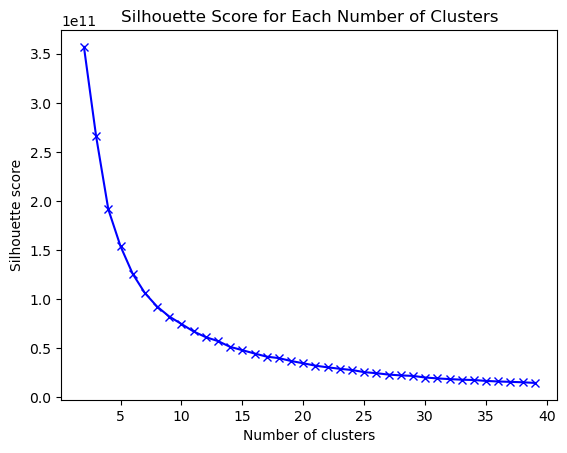

Optimal number of clusters: 2


In [102]:

X = players_signatures_df

silhouette_scores = []
wcsss_scores = []
range_n_clusters = list(range(2, 40))  # Example range from 2 to 10 clusters

for n_clusters in range_n_clusters:
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)
    # silhouette_avg = silhouette_score(X, cluster_labels)
    wcsss = clusterer.inertia_
    # silhouette_scores.append(silhouette_avg)
    wcsss_scores.append(wcsss)

# Plot silhouette scores
plt.figure()
plt.plot(range_n_clusters, wcsss_scores, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Silhouette Score for Each Number of Clusters')
plt.show()

# Determine the optimal number of clusters
optimal_n_clusters = range_n_clusters[wcsss_scores.index(max(wcsss_scores))]
print(f'Optimal number of clusters: {optimal_n_clusters}')


In [103]:
kmeans = KMeans(n_clusters=9, random_state=0).fit(X)

In [184]:

def is_leap_year(year):
    """Return True if the year is a leap year, False otherwise."""
    return year % 4 == 0 and (year % 100 != 0 or year % 400 == 0)

def adjust_for_leap_year(days_per_month, year):
    """Adjust the February days in the dictionary for a leap year."""
    if is_leap_year(year):
        days_per_month["February"] = 29
    else:
        days_per_month["February"] = 28


def get_days_per_month(year):
    #
    #  Days per month in a non-leap year
    days_per_month = {
        "January": 31,
        "February": 28,
        "March": 31,
        "April": 30,
        "May": 31,
        "June": 30,
        "July": 31,
        "August": 31,
        "September": 30,
        "October": 31,
        "November": 30,
        "December": 31
    }



    adjust_for_leap_year(days_per_month, year)
    days_array=[v for v in days_per_month.values()]
    month_days_mapping={i:days_array[i] for i in range(len(days_array))}
    return month_days_mapping


In [185]:
month_days_mapping=get_days_per_month(2024)


In [122]:
example=players_dict['edsvoboda'].copy()

In [123]:
years=set(example['Year'])




In [131]:
def get_num_dats(seconds):
    days = seconds // (24 * 60 * 60)
    return int(days)

example["DaysSinceStart"]=example["Timestamp"].apply(lambda t:get_num_dats(t))


In [136]:
end

1084

In [15]:
players_dict

{'edsvoboda':      Unnamed: 0     Player   Elo        Date      Time  FICSGamesDBGameNo  \
 0       8536288  edsvoboda  1334  2008.12.18  11:59:00          221067024   
 1       8617930  edsvoboda  1387  2009.01.01  11:37:00          220028103   
 2       8613289  edsvoboda  1402  2009.01.02  14:46:00          220099961   
 3       8613165  edsvoboda  1401  2009.01.02  15:28:00          220102179   
 4       8609070  edsvoboda  1394  2009.01.03  16:45:00          220163575   
 ..          ...        ...   ...         ...       ...                ...   
 242     1824691  edsvoboda  1584  2011.12.21  10:44:00          290012253   
 243     1824638  edsvoboda  1517  2011.12.21  11:12:00          290012957   
 244     1824427  edsvoboda  1485  2011.12.21  11:59:00          290015857   
 245     1824388  edsvoboda  1453  2011.12.21  12:17:00          290016345   
 246     1824243  edsvoboda  1503  2011.12.21  12:30:00          290018426   
 
      Year  Month  Day   Timestamp Grade  
 0    

In [329]:
def get_num_dats(seconds):
    days = seconds // (24 * 60 * 60)
    return int(days)

def get_player_timestamp(players_dict,p):
    example=players_dict[p]
    example["DaysSinceStart"]=example["Timestamp"].apply(lambda t:get_num_dats(t))
    player_elo=[]
    missing=0
    start=min(example["DaysSinceStart"])
    end=max(example["DaysSinceStart"])
    for i in range(start,end,90):
        if len(example[example["DaysSinceStart"]==i])==0:
            index=max(example[example["DaysSinceStart"]<=i].index)
            player_elo.append(list(example[example.index==index]["Elo"].values)[0])
            missing=missing+1
        else:
            index=max(example[example["DaysSinceStart"]==i].index)
            player_elo.append(list(example[example.index==index]["Elo"].values)[0])
    return player_elo,missing


In [330]:
modified_elo={}
i=0
total=len(players_dict.keys())
for player in (players_dict.keys()):
    modified_elo[player]=get_player_timestamp(players_dict,player)
    if i%1000==0:
        print((i/total)*100)
    i=i+1

0.0
4.9431537320810675
9.886307464162135
14.829461196243205
19.77261492832427
24.715768660405338
29.65892239248641
34.602076124567475
39.54522985664854
44.488383588729604
49.431537320810676
54.37469105289174
59.31784478497282
64.26099851705388
69.20415224913495
74.14730598121602
79.09045971329708
84.03361344537815
88.97676717745921
93.9199209095403
98.86307464162135


In [331]:
with open(f"{PROJECT_PATH}/data/fics/interim/modified_elo_v4.pkl", 'wb') as f:
    pickle.dump(modified_elo, f)

In [269]:
len(modified_elo['edsvoboda'][0])


37

In [287]:
def to_df(my_dict):
    players_signatures_dict={
    "Player":[]
    }

    for k,v in my_dict.items():
        for i in range(24):
            players_signatures_dict[i]=players_signatures_dict.get(i,[])
        tmp=[]
        bad=False
        
        for i in range(24):
            try:
                tmp.append(v[0][i])
            except Exception as err:
                bad=True
        if not bad:
            players_signatures_dict["Player"].append(k)
            for i in range(24):
                players_signatures_dict[i].append(v[0][i])
    
    print(players_signatures_dict)
    return pd.DataFrame.from_dict(players_signatures_dict)



    

In [370]:
df3=to_df(modified_elo)
players=list(df3["Player"])
df3.index=players
# df3.drop(columns="Player")


{'Player': ['tunretni', 'Ajnabee', 'rocco', 'locco', 'GonzalesZS', 'umbeebmu', 'SmallCheese', 'Sergyksi', 'plamb', 'CloneHat', 'rntjr', 'MiloBot', 'FanshiMausu', 'louarn', 'kirya', 'ashtar', 'tyumen', 'reroiatti', 'ChessMethOde', 'Buriag', 'Arnoldus', 'coffeefreak', 'TwistedLogicX', 'rolandm', 'DBCHESS', 'fabianopoa', 'Lynd', 'Stonebuck', 'Imox', 'ACAzc', 'Ferron', 'groovyhassle', 'RHE', 'saadbaraa', 'IagainstI', 'eminx', 'Naujoel', 'himmyk', 'antoniblind', 'ulika', 'kattai', 'briancheng', 'DerMon', 'boskey', 'Whitejoker', 'ansett', 'PietroCiuffreda', 'prachurya', 'PCChess', 'SouthItaly', 'koadjao', 'Ishtaire', 'ktmk', 'Quwhy', 'Mfumu', 'axisjump', 'insidetrip', 'jariv', 'Guerrillero', 'bobbydan', 'Toobab', 'sungangyi', 'mjigr', 'melatechess', 'LetsCelebrate', 'pjreid', 'Edwinn', 'EddieTwo', 'janmar', 'bougie', 'mcochentaysiete', 'KillerStaunton', 'backlit', 'Niovol', 'zitterbart', 'DeMeTrIo', 'Pinouch', 'ForGameNotMoney', 'Tomasdzonsas', 'dragonbladesixtwo', 'Gilgri', 'carlosvalero', 

In [333]:
players

['tunretni',
 'Ajnabee',
 'rocco',
 'locco',
 'GonzalesZS',
 'umbeebmu',
 'SmallCheese',
 'Sergyksi',
 'plamb',
 'CloneHat',
 'rntjr',
 'MiloBot',
 'FanshiMausu',
 'louarn',
 'kirya',
 'ashtar',
 'tyumen',
 'reroiatti',
 'ChessMethOde',
 'Buriag',
 'Arnoldus',
 'coffeefreak',
 'TwistedLogicX',
 'rolandm',
 'DBCHESS',
 'fabianopoa',
 'Lynd',
 'Stonebuck',
 'Imox',
 'ACAzc',
 'Ferron',
 'groovyhassle',
 'RHE',
 'saadbaraa',
 'IagainstI',
 'eminx',
 'Naujoel',
 'himmyk',
 'antoniblind',
 'ulika',
 'kattai',
 'briancheng',
 'DerMon',
 'boskey',
 'Whitejoker',
 'ansett',
 'PietroCiuffreda',
 'prachurya',
 'PCChess',
 'SouthItaly',
 'koadjao',
 'Ishtaire',
 'ktmk',
 'Quwhy',
 'Mfumu',
 'axisjump',
 'insidetrip',
 'jariv',
 'Guerrillero',
 'bobbydan',
 'Toobab',
 'sungangyi',
 'mjigr',
 'melatechess',
 'LetsCelebrate',
 'pjreid',
 'Edwinn',
 'EddieTwo',
 'janmar',
 'bougie',
 'mcochentaysiete',
 'KillerStaunton',
 'backlit',
 'Niovol',
 'zitterbart',
 'DeMeTrIo',
 'Pinouch',
 'ForGameNotMoney

In [372]:
df3.index=list(df3["Player"])

In [373]:
df3=df3.drop(columns="Player")

In [336]:
from itertools import groupby



In [375]:
def get_total_con(array):

    # Use groupby to group consecutive identical elements
    consecutive_counts = [(k, sum(1 for _ in g)) for k, g in groupby(array)]

    good=True
    # Print the value and its consecutive count
    for value, count in consecutive_counts:
        if count>=2:
            return True
    return False

total=len(list(df3.index))
total_bad=[]
for p in list(df3.index):
    if  get_total_con(list(df3[df3.index==p].values)[0]):
        total_bad.append(p)

In [377]:

df3=df3[~df3.index.isin(set(total_bad))]
total-len(total_bad)

759

In [378]:
df3

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
rntjr,1264,1247,1254,1225,1229,1344,1295,1348,1360,1306,...,1334,1306,1377,1218,1349,1399,1373,1369,1324,1369
louarn,1630,1436,1495,1519,1415,1497,1416,1443,1392,1428,...,1446,1450,1418,1506,1490,1558,1514,1575,1505,1561
groovyhassle,1373,1413,1365,1379,1384,1326,1300,1293,1294,1353,...,1282,1329,1408,1454,1427,1343,1436,1367,1381,1365
kattai,1427,1442,1143,1156,1104,1209,1182,1174,1222,1248,...,1310,1260,1335,1331,1380,1387,1345,1368,1358,1339
PCChess,1354,962,1231,1487,1594,1582,1664,1652,1686,1753,...,2004,2046,2042,2079,2073,2161,2202,2133,2047,1899
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ezyaly,1720,1090,1227,1254,1271,1242,1351,1323,1372,1341,...,1304,1386,1390,1389,1328,1449,1459,1486,1407,1422
jdean,1752,1532,1635,1550,1662,1643,1644,1668,1636,1578,...,1651,1731,1673,1629,1640,1649,1633,1650,1692,1745
archship,1735,1677,1670,1692,1644,1609,1570,1618,1646,1683,...,1640,1650,1621,1703,1701,1717,1738,1817,1804,1762
billycollierIII,1720,1135,1166,1297,1338,1422,1357,1349,1457,1489,...,1472,1543,1556,1554,1605,1677,1709,1663,1650,1670


,0,1,2,3,4,5,6,7,8,9,...,48,49,50,51,52,53,54,55,56,57
MPSPB,1659,1678,1638,1661,1627,1627,1627,1619,1647,1624,...,1691,1698,1698,1718,1699,1699,1699,1699,1699,1699
subcutaneo,1717,1673,1709,1678,1658,1646,1644,1625,1624,1624,...,1630,1531,1504,1527,1527,1527,1541,1574,1555,1551
hemantdhawan,1336,1396,1396,1349,1349,1349,1343,1343,1343,1343,...,1385,1385,1385,1385,1385,1385,1353,1363,1374,1376
lostpawns,1671,1677,1683,1683,1683,1683,1654,1633,1705,1711,...,1776,1776,1776,1776,1776,1776,1776,1776,1776,1776
GlaurungC,2546,2519,2519,2519,2519,2527,2527,2527,2527,2527,...,2529,2529,2548,2548,2563,2563,2575,2575,2566,2566
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
chessraj,1210,1280,1295,1331,1380,1391,1390,1388,1407,1398,...,1371,1371,1371,1371,1371,1371,1371,1371,1371,1371
ldrucifer,1753,1820,1874,1850,1843,1841,1841,1864,1860,1868,...,1837,1837,1837,1837,1837,1837,1837,1837,1837,1837
MChessplayer,1302,1335,1356,1349,1305,1316,1323,1365,1373,1387,...,1515,1535,1547,1533,1498,1511,1477,1547,1536,1506
chessmassive,1704,1663,1638,1654,1639,1611,1602,1608,1613,1601,...,1619,1619,1619,1619,1619,1619,1630,1602,1598,1556


In [224]:
players_dict

{'edsvoboda':         Player   Elo        Date      Time  FICSGamesDBGameNo  Year  Month  \
 0    edsvoboda  1416  2009.03.12  20:24:00          223687854  2009      3   
 1    edsvoboda  1426  2009.03.13  14:57:00          223725736  2009      3   
 2    edsvoboda  1431  2009.03.13  16:24:00          223730020  2009      3   
 3    edsvoboda  1422  2009.03.13  16:41:00          223730779  2009      3   
 4    edsvoboda  1415  2009.03.13  16:47:00          223731071  2009      3   
 ..         ...   ...         ...       ...                ...   ...    ...   
 191  edsvoboda  1584  2011.12.21  10:44:00          290012253  2011     12   
 192  edsvoboda  1517  2011.12.21  11:12:00          290012957  2011     12   
 193  edsvoboda  1485  2011.12.21  11:59:00          290015857  2011     12   
 194  edsvoboda  1453  2011.12.21  12:17:00          290016345  2011     12   
 195  edsvoboda  1503  2011.12.21  12:30:00          290018426  2011     12   
 
      Day   Timestamp Grade  DaysSinc

In [14]:
def get_samples_grouped(players_dict,num_samples):
    samples={}
    groups={}
    for p in players_dict:
        try:
            v=players_dict[p]
            arr=list(v[(v.index<num_samples)]["Elo"])
            samples[p]=arr
            groups[p]=list(v["Grade"])[0]
        except Exception as err:
            print(err)
            pass
        
    for p in list(samples.keys()):
        if len(samples[p])!=num_samples:
            del samples[p]

    samples_grouped={}
    for p in samples.keys():
        g=groups[p]
        samples_grouped[g]=samples_grouped.get(g,{str(i):[] for i in range(num_samples)})
        samples_grouped[g]["Player"]=samples_grouped[g].get("Player",[])
        samples_grouped[g]["Player"].append(p)
        v=list(samples[p])
        for i in range(num_samples):
            samples_grouped[g][str(i)].append(v[i])


    return samples_grouped

In [15]:
with open(f"{PROJECT_PATH}/data/fics/interim/players_dict_v2.pkl", 'rb') as f:
    players_dict=pickle.load(f)

In [21]:
samples_grouped=get_samples_grouped(players_dict,150)

In [22]:
for g in samples_grouped.keys():
    print(len(samples_grouped[g]),g)

151 G
151 H
151 I
151 J
151 F
151 L
151 K
151 D
151 M
151 E


In [23]:
all_df={}
for g in samples_grouped.keys():
    all_df[g]=pd.DataFrame.from_dict(samples_grouped[g])


In [24]:
for k in tqdm(all_df.keys()):
    c=all_df[k]
    players=list(c["Player"])
    c.index=players
    c=c.drop(columns="Player")
    all_df[k]=c

100%|██████████| 10/10 [00:00<00:00, 941.21it/s]


In [27]:
h=all_df["H"]
df=h

In [28]:
def sliding_window(window_size,data):
    window_means = []
    for i in range(len(data) - window_size + 1):
        window = data[i:i+window_size]
        window_mean = np.mean(window)
        window_means.append(window_mean)
    return window_means


In [379]:
df_ma=df3

In [380]:
from sklearn.preprocessing import StandardScaler

# Standardizing (z-score normalization) a dataset involves rescaling the distribution of values 
# so the mean of observed values is 0 and the standard deviation is 1. 
# Taken from https://machinelearningmastery.com/how-to-improve-neural-network-stability-and-modeling-performance-with-data-scaling/
ss = StandardScaler()
scaled_ss = ss.fit_transform(df_ma)
df_ss = pd.DataFrame(scaled_ss, columns=df_ma.columns, index=df_ma.index)
X_ss = df_ss.values
df_ss.head()

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
rntjr,-1.721352,-1.535852,-1.572395,-1.738579,-1.811512,-1.319168,-1.571483,-1.365443,-1.352080,-1.665366,...,-1.605313,-1.772804,-1.431288,-2.280038,-1.645730,-1.419376,-1.576805,-1.589109,-1.821354,-1.590747
louarn,-0.014415,-0.686951,-0.479685,-0.399328,-0.943944,-0.604918,-1.005824,-0.913853,-1.197310,-1.066554,...,-1.061565,-1.082892,-1.236042,-0.872293,-0.959406,-0.652212,-0.892492,-0.595128,-0.942266,-0.681167
groovyhassle,-1.213002,-0.790256,-1.069114,-1.037066,-1.088538,-1.403198,-1.548109,-1.626890,-1.671292,-1.434676,...,-1.857767,-1.662610,-1.283663,-1.126469,-1.266062,-1.689572,-1.271048,-1.598759,-1.544514,-1.609697
kattai,-0.961159,-0.660002,-2.075676,-2.052893,-2.394556,-1.949390,-2.099743,-2.192566,-2.019524,-1.950046,...,-1.721830,-1.993193,-1.631295,-1.727694,-1.494836,-1.477275,-1.712697,-1.593934,-1.656221,-1.732869
PCChess,-1.301613,-2.815940,-1.676678,-0.545097,-0.109025,-0.208112,0.153544,0.079646,0.224635,0.528640,...,1.647465,1.772577,1.735503,1.928534,1.878372,2.257223,2.446565,2.097307,1.690142,0.920072


In [381]:
from sklearn.preprocessing import MinMaxScaler

# Normalization is a rescaling of the data from the original range so that all values are within the range of 0 and 1.
# Taken from https://machinelearningmastery.com/how-to-improve-neural-network-stability-and-modeling-performance-with-data-scaling/
mm = MinMaxScaler()
scaled_mm = mm.fit_transform(df_ma)
df_mm = pd.DataFrame(scaled_mm, columns=df_ma.columns, index=df_ma.index)
X_mm = df_mm.values
df_mm.head()

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
rntjr,0.212673,0.204997,0.200521,0.162516,0.147665,0.205508,0.159521,0.138043,0.140205,0.086874,...,0.084236,0.075882,0.163536,0.000000,0.083382,0.121858,0.101351,0.095538,0.097321,0.082995
louarn,0.442284,0.326073,0.357422,0.355177,0.275412,0.313559,0.235813,0.199611,0.160691,0.164236,...,0.151625,0.160588,0.186188,0.164571,0.165026,0.208743,0.180743,0.213387,0.196282,0.194428
groovyhassle,0.281054,0.311339,0.272786,0.263434,0.254121,0.192797,0.162673,0.102398,0.097951,0.116677,...,0.052948,0.089412,0.180663,0.134857,0.128547,0.091257,0.136824,0.094394,0.128486,0.080673
kattai,0.314931,0.329917,0.128255,0.117300,0.061813,0.110169,0.088272,0.025275,0.051857,0.050095,...,0.069795,0.048824,0.140331,0.064571,0.101332,0.115301,0.085586,0.094966,0.115910,0.065583
PCChess,0.269134,0.022422,0.185547,0.334207,0.398352,0.373588,0.392182,0.335062,0.348912,0.370323,...,0.487365,0.511176,0.530939,0.492000,0.502606,0.538251,0.568131,0.532609,0.492619,0.390598


In [382]:
from matplotlib.patches import ConnectionPatch
import matplotlib.pyplot as plt
import numpy as np
import scipy.spatial.distance as dist

def dp(dist_mat):
    """
    Find minimum-cost path through matrix `dist_mat` using dynamic programming.

    The cost of a path is defined as the sum of the matrix entries on that
    path. See the following for details of the algorithm:

    - http://en.wikipedia.org/wiki/Dynamic_time_warping
    - https://www.ee.columbia.edu/~dpwe/resources/matlab/dtw/dp.m

    The notation in the first reference was followed, while Dan Ellis's code
    (second reference) was used to check for correctness. Returns a list of
    path indices and the cost matrix.
    """

    N, M = dist_mat.shape
    
    # Initialize the cost matrix
    cost_mat = np.zeros((N + 1, M + 1))
    for i in range(1, N + 1):
        cost_mat[i, 0] = np.inf
    for i in range(1, M + 1):
        cost_mat[0, i] = np.inf

    # Fill the cost matrix while keeping traceback information
    traceback_mat = np.zeros((N, M))
    for i in range(N):
        for j in range(M):
            penalty = [
                cost_mat[i, j],      # match (0)
                cost_mat[i, j + 1],  # insertion (1)
                cost_mat[i + 1, j]]  # deletion (2)
            i_penalty = np.argmin(penalty)
            cost_mat[i + 1, j + 1] = dist_mat[i, j] + penalty[i_penalty]
            traceback_mat[i, j] = i_penalty

    # Traceback from bottom right
    i = N - 1
    j = M - 1
    path = [(i, j)]
    while i > 0 or j > 0:
        tb_type = traceback_mat[i, j]
        if tb_type == 0:
            # Match
            i = i - 1
            j = j - 1
        elif tb_type == 1:
            # Insertion
            i = i - 1
        elif tb_type == 2:
            # Deletion
            j = j - 1
        path.append((i, j))

    # Strip infinity edges from cost_mat before returning
    cost_mat = cost_mat[1:, 1:]
    return (path[::-1], cost_mat)

K = 2. Took 9.73 seconds to calculate.
K = 3. Took 16.79 seconds to calculate.
K = 4. Took 16.17 seconds to calculate.
K = 5. Took 19.07 seconds to calculate.
K = 6. Took 25.50 seconds to calculate.
K = 7. Took 22.88 seconds to calculate.
K = 8. Took 24.78 seconds to calculate.
K = 9. Took 20.39 seconds to calculate.
K = 10. Took 57.11 seconds to calculate.


ValueError: x and y must have same first dimension, but have shapes (8,) and (9,)

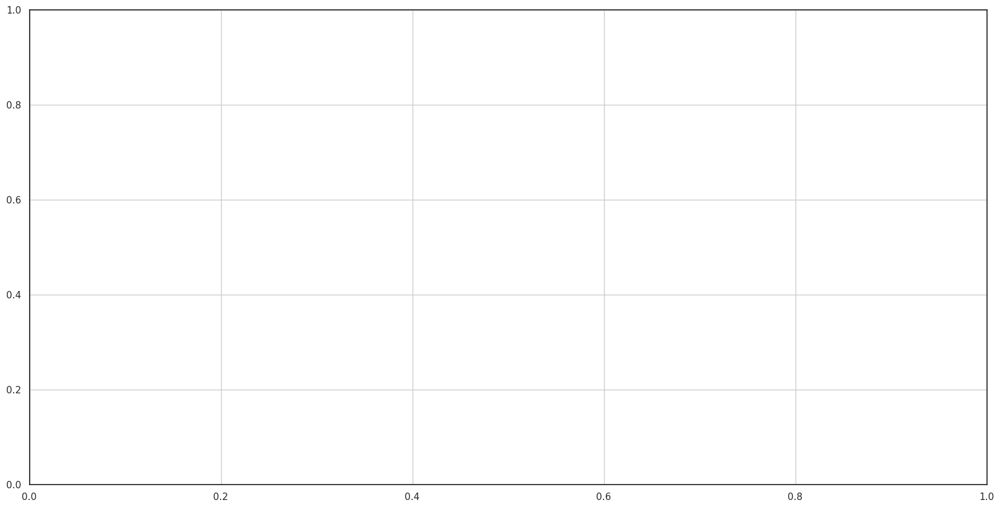

In [383]:
wcss=kmeans_calinski_harabasz(X_ss,"dtw",f"kmeans_dtw_150_v2",10)

In [63]:
# Experiment number 1. (1/2)
from sklearn.metrics import  calinski_harabasz_score
silhoutte_score_ss = []
X=df_ma.values
for i in range(2, 60):

  start = time.time()

  km = TimeSeriesKMeans(n_clusters=i, metric="euclidean", max_iter=20, max_iter_barycenter=10, random_state=0)
  y_pred_ss = km.fit_predict(X)
  print("1",time.time()-start)
  score_ss = calinski_harabasz_score(X, y_pred_ss)
  print("2",time.time()-start)

  silhoutte_score_ss.append(score_ss)

  stop = time.time()
  duration = stop - start

  print(f"K = {i}.", f"Took {duration:.2f} {score_ss} seconds to calculate.")

1 0.7073125839233398
2 0.7086145877838135
K = 2. Took 0.71 1547.126789805145 seconds to calculate.
1 0.9254109859466553
2 0.9267237186431885
K = 3. Took 0.93 1499.2005322664038 seconds to calculate.
1 0.9180123805999756
2 0.919487714767456
K = 4. Took 0.92 1381.1783903417129 seconds to calculate.
1 0.924614429473877
2 0.9259593486785889
K = 5. Took 0.93 1274.800297041598 seconds to calculate.
1 0.9258670806884766
2 0.9272544384002686
K = 6. Took 0.93 1159.968463807601 seconds to calculate.
1 0.8194169998168945
2 0.8207187652587891
K = 7. Took 0.82 1107.3803414783238 seconds to calculate.
1 0.9352593421936035
2 0.9367482662200928
K = 8. Took 0.94 936.4037191690172 seconds to calculate.
1 0.9103760719299316
2 0.9117751121520996
K = 9. Took 0.91 910.0021967172261 seconds to calculate.
1 0.8534080982208252
2 0.8549809455871582
K = 10. Took 0.85 867.4294466232383 seconds to calculate.
1 0.8805108070373535
2 0.8820712566375732
K = 11. Took 0.88 819.2462598789393 seconds to calculate.
1 0.861

KeyboardInterrupt: 

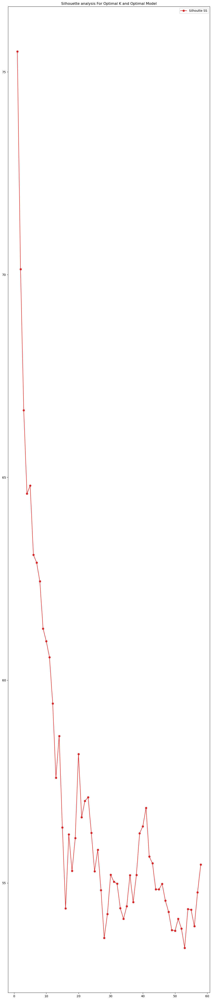

In [54]:
# Experiment number 1.
plt.figure(figsize=(12, 59))
plt.plot(range(1, 59), silhoutte_score_ss, "-o", c="C3")
plt.title("Silhouette analysis For Optimal K and Optimal Model")
plt.legend(["Silhoutte SS"]);

In [69]:
# Experiment number 1. (1/2)
from sklearn.metrics import  calinski_harabasz_score
silhoutte_score_ss = []

for i in range(2, 40):

  start = time.time()

  km = TimeSeriesKMeans(n_clusters=i, metric="euclidean", max_iter=20, max_iter_barycenter=10, random_state=0)
  y_pred_ss = km.fit_predict(X_ss.T)
  print("1",time.time()-start)
  score_ss = calinski_harabasz_score(X_ss.T, y_pred_ss)
  print("2",time.time()-start)

  silhoutte_score_ss.append(score_ss)

  stop = time.time()
  duration = stop - start

  print(f"K = {i}.", f"Took {duration:.2f} {score_ss} seconds to calculate.")

1 0.02850484848022461
2 0.02955794334411621
K = 2. Took 0.03 66.2668567378562 seconds to calculate.
1 0.0420835018157959
2 0.042844295501708984
K = 3. Took 0.04 61.97823163872344 seconds to calculate.
1 0.06978678703308105
2 0.07055449485778809
K = 4. Took 0.07 59.00754893384002 seconds to calculate.
1 0.10185909271240234
2 0.10268568992614746
K = 5. Took 0.10 56.92750441408005 seconds to calculate.
1 0.07754373550415039
2 0.07840895652770996
K = 6. Took 0.08 56.60106235890263 seconds to calculate.
1 0.0750885009765625
2 0.07593488693237305
K = 7. Took 0.08 54.835238209172196 seconds to calculate.
1 0.05604290962219238
2 0.057019710540771484
K = 8. Took 0.06 55.67633852459016 seconds to calculate.
1 0.06398153305053711
2 0.0650475025177002
K = 9. Took 0.07 56.261709031933705 seconds to calculate.
1 0.06243443489074707
2 0.06335735321044922
K = 10. Took 0.06 54.503174346693406 seconds to calculate.
1 0.04568052291870117
2 0.0465695858001709
K = 11. Took 0.05 54.53028028810241 seconds to

In [60]:
# Experiment number 1. (1/2)
from sklearn.metrics import  calinski_harabasz_score
silhoutte_score_ss = []
X=df_ma.values
for i in range(2, 60):

  start = time.time()

  km = TimeSeriesKMeans(n_clusters=i, metric="dtxw", max_iter=20, max_iter_barycenter=10, random_state=0)
  y_pred_ss = km.fit_predict(X)
  print("1",time.time()-start)
  # score_ss = calinski_harabasz_score(X, y_pred_ss)
  score_ss = silhouette_score(X, y_pred_ss,"dtw")
  print("2",time.time()-start)

  silhoutte_score_ss.append(score_ss)

  stop = time.time()
  duration = stop - start

  print(f"K = {i}.", f"Took {duration:.2f} {score_ss} seconds to calculate.")

ValueError: Incorrect metric: dtxw (should be one of 'dtw', 'softdtw', 'euclidean')

In [56]:
X=df_ma.T.values
X

array([[1505, 1435, 1465, ..., 1505, 1480, 1482],
       [1391, 1433, 1688, ..., 1500, 1514, 1506],
       [1425, 1428, 1632, ..., 1494, 1510, 1512],
       ...,
       [1356, 1425, 1518, ..., 1499, 1500, 1571],
       [1367, 1431, 1508, ..., 1503, 1504, 1580],
       [1375, 1436, 1519, ..., 1495, 1509, 1585]])

In [58]:
df_ma.T

,tunretni,Ajnabee,SuperTony,metoo,drylogic,rolandm,dorj,ACAzc,Ferron,obsessed,...,SchustiG,svengali,taoistictraveller,iggman,Ljubomyr,pedrodeg,pawntodfour,clcprodigy,Collibri,MrEuroman
0,1505,1435,1465,1592,1576,1579,1552,1408,1509,1466,...,1414,1552,1582,1456,1585,1531,1520,1505,1480,1482
1,1391,1433,1688,1592,1637,1228,1545,1383,1512,1478,...,1311,1616,1587,1477,1617,1407,1534,1500,1514,1506
2,1425,1428,1632,1685,1526,1264,1553,1394,1505,1511,...,1419,1671,1621,1472,1644,1480,1547,1494,1510,1512
3,1313,1481,1567,1717,1555,1285,1545,1390,1521,1518,...,1395,1671,1637,1466,1674,1569,1501,1505,1505,1491
4,1233,1490,1524,1571,1577,1316,1538,1366,1505,1509,...,1504,1700,1637,1476,1703,1547,1381,1517,1516,1484
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,1358,1425,1526,1484,1236,1521,1598,1413,1511,1483,...,1644,1600,1683,1459,1617,1496,1623,1499,1510,1563
146,1350,1425,1527,1478,1232,1522,1609,1428,1518,1470,...,1634,1607,1694,1458,1636,1502,1629,1508,1504,1573
147,1356,1425,1518,1470,1230,1523,1637,1423,1510,1458,...,1624,1598,1684,1453,1622,1510,1634,1499,1500,1571
148,1367,1431,1508,1476,1226,1524,1655,1421,1503,1467,...,1620,1603,1675,1464,1604,1471,1627,1503,1504,1580


In [ ]:
# group data by each timeserie
grouped = data.groupby(0)
series = [group.drop(labels=[0,1], axis=1) for name, group in grouped]
# number of clusters
k = 6
# length of chunks
chunk_length = 10
# go through groups and compute chunks and labels
train_set = []
true_labels = []
for serie in series:
    reversed_serie = serie.iloc[::-1]
    for i in range(len(serie) // chunk_length):        
        chunk = reversed_serie[i*10:(i+1)*10]
        true_label = i
        train_set.append(chunk)
        true_labels.append(true_label)

In [ ]:
# Experiment number 1. (1/2)
from sklearn.metrics import  calinski_harabasz_score
silhoutte_score_ss = []

for i in range(2, 40):

  start = time.time()

  km = TimeSeriesKMeans(n_clusters=i, metric="euclidean", max_iter=20, max_iter_barycenter=10, random_state=0)
  y_pred_ss = km.fit_predict(X_ss)
  print("1",time.time()-start)
  score_ss = calinski_harabasz_score(X_ss, y_pred_ss)
  print("2",time.time()-start)

  silhoutte_score_ss.append(score_ss)

  stop = time.time()
  duration = stop - start

  print(f"K = {i}.", f"Took {duration:.2f} {score_ss} seconds to calculate.")

1 222.3730444908142
2 222.37428760528564
K = 2. Took 222.37 468.20273449848526 seconds to calculate.


KeyboardInterrupt: 

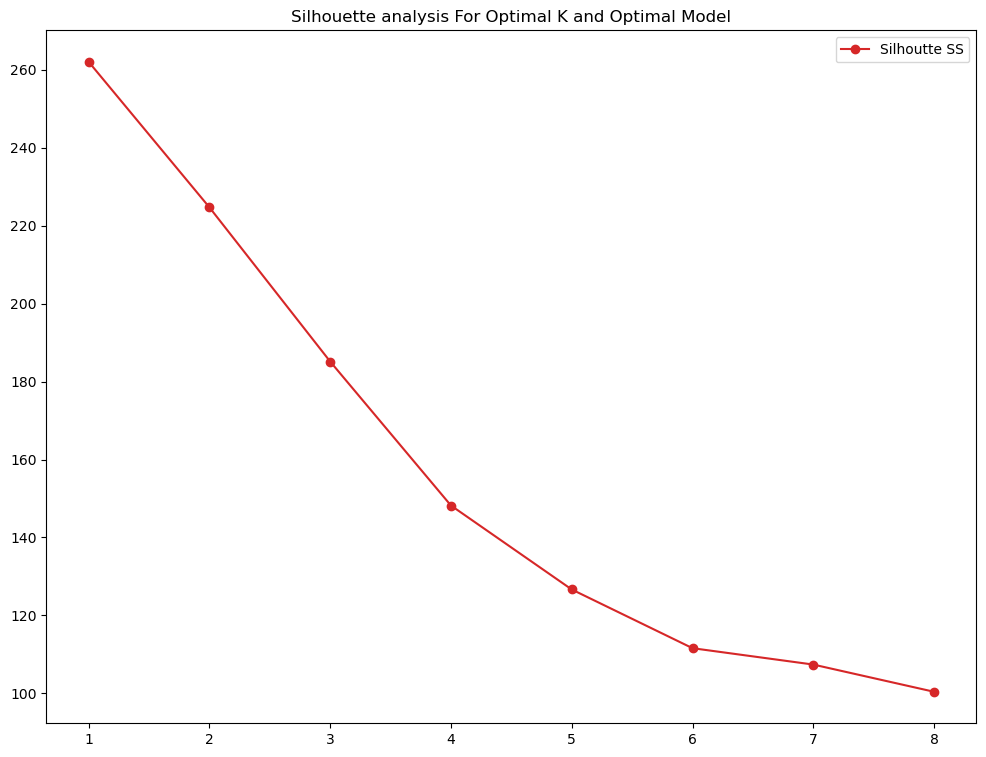

In [44]:
# Experiment number 1.
plt.figure(figsize=(12, 9))
plt.plot(range(1, 9), silhoutte_score_ss, "-o", c="C3")
plt.title("Silhouette analysis For Optimal K and Optimal Model")
plt.legend(["Silhoutte SS"]);

In [ ]:
# Based on the Silhoutte Score the best K = , the best metric is , and the best tecnique to normalize is MinMax
km = TimeSeriesKMeans(n_clusters=4, metric="softdtw", max_iter=20, max_iter_barycenter=10, random_state=0)
y_pred_mm = km.fit_predict(X_mm)

for yi in range(len(np.unique(y_pred_mm))):
  for xx in X_mm[y_pred_mm == yi]:
    plt.plot(xx.ravel(), "k-", alpha=.2)
  plt.plot(km.cluster_centers_[yi].ravel(), "r-")
  plt.xlim(0, X_mm.shape[1])
  plt.ylim(-0.2, 1.2)
  plt.text(0.55, 0.85,'Cluster %d' % (yi + 1), transform=plt.gca().transAxes)
  if yi == 0:
    plt.title("Soft-DTW $k$-means")

  plt.tight_layout()
  plt.show();

In [98]:
extra_detail={
    'mean':[],
    'var':[],
    'std':[],
    'Player':[],
}
for p in list(h.index):
    c=list(h[h.index==p].values)
    extra_detail['Player'].append(p)
    extra_detail['mean'].append(np.mean(c))
    extra_detail['var'].append(np.var(c))
    extra_detail['std'].append(np.std(c))
extra_detail=pd.DataFrame.from_dict(extra_detail)

In [123]:
extra_detail

,mean,var,std,Player
0,1308.660000,3798.491067,61.631900,tunretni
1,1414.986667,2312.759822,48.091162,Ajnabee
2,1553.340000,1243.557733,35.264114,SuperTony
3,1547.086667,2271.439156,47.659618,metoo
4,1350.833333,7409.498889,86.078446,drylogic
...,...,...,...,...
1670,1535.293333,5844.927289,76.452124,pedrodeg
1671,1562.066667,2406.302222,49.054074,pawntodfour
1672,1497.860000,1248.200400,35.329880,clcprodigy
1673,1519.733333,597.408889,24.441949,Collibri


100%|██████████| 1675/1675 [00:01<00:00, 1442.98it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


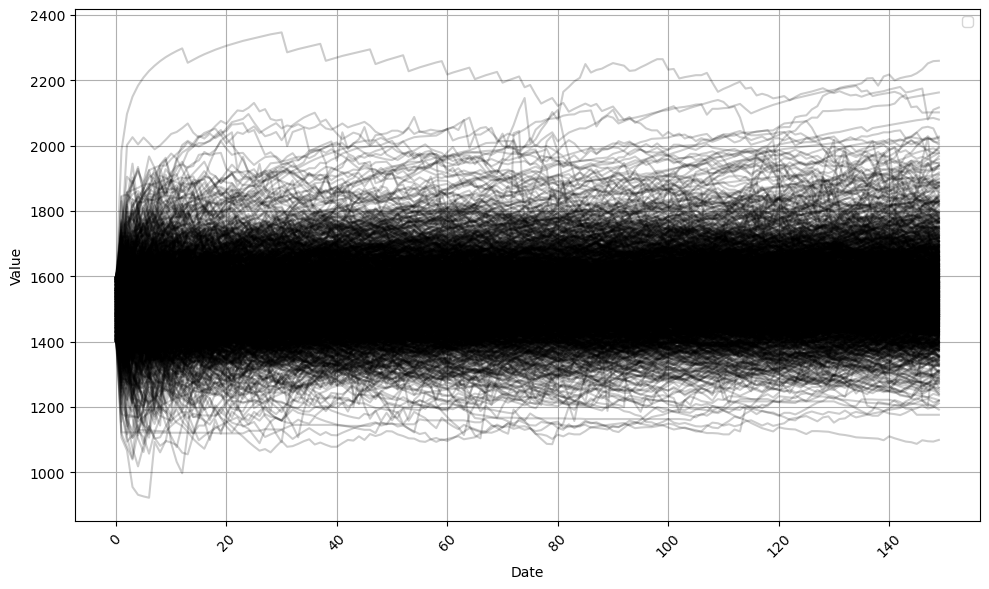

100%|██████████| 1675/1675 [00:01<00:00, 1524.73it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


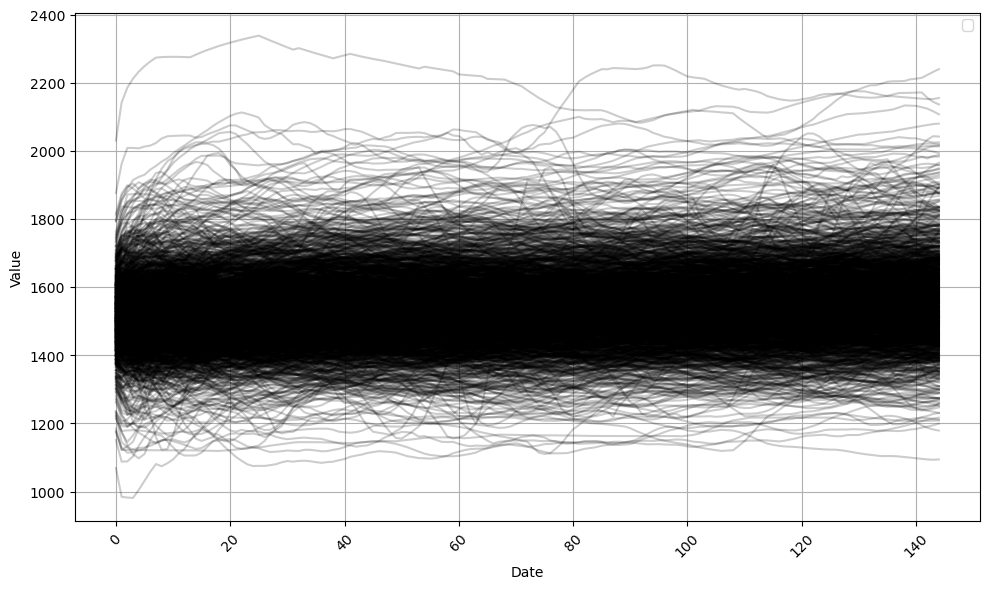

100%|██████████| 1675/1675 [00:01<00:00, 1506.00it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


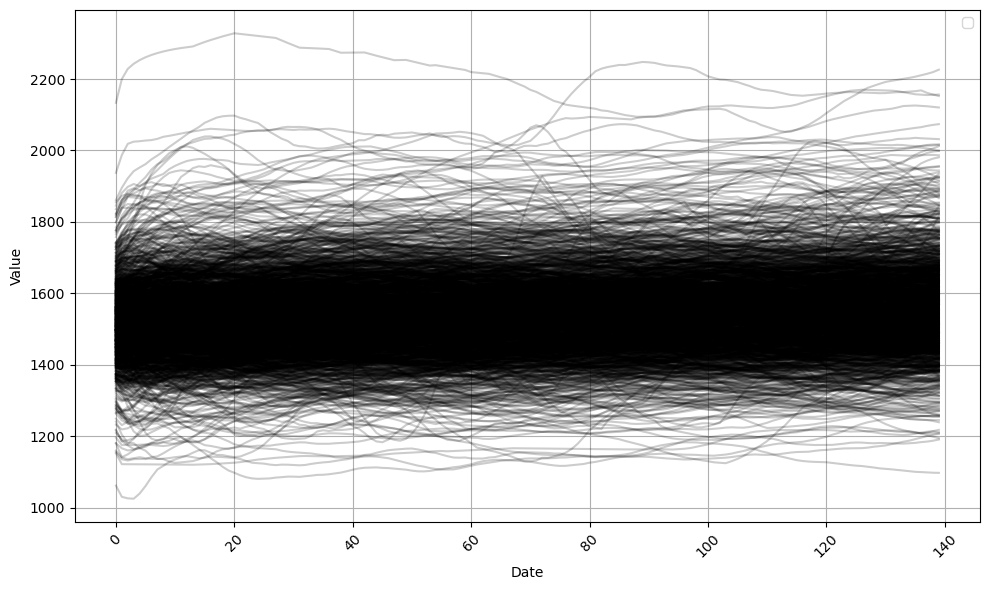

100%|██████████| 1675/1675 [00:01<00:00, 1609.06it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


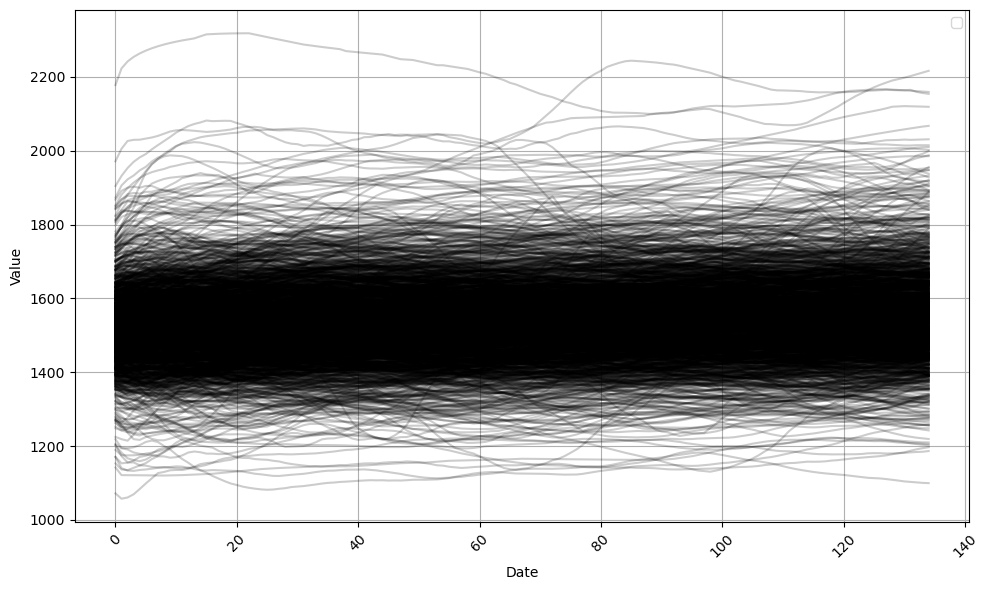

In [151]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
def sliding_window(window_size,data):
    window_means = []
    for i in range(len(data) - window_size + 1):
        window = data[i:i+window_size]
        window_mean = np.mean(window)
        window_means.append(window_mean)
    return window_means


for w in range(1,20,5):
    # Plotting
    plt.figure(figsize=(10, 6))
    plt.grid()
    for p in tqdm(h.index):
        x=[i for i in range(0,150-w+1)]
        y=list(h[h.index==p].values)[0]
        ys=sliding_window(w,y)
        plt.plot(x, ys, 'k-',alpha=.2)

    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()




100%|██████████| 1675/1675 [00:01<00:00, 1531.10it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


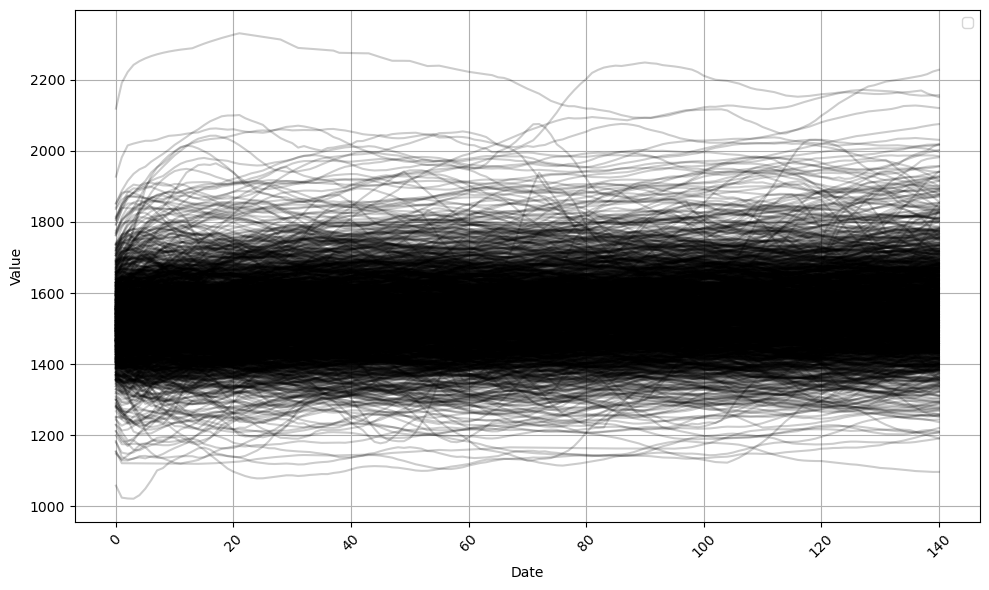

In [152]:
# Plotting
w=10
plt.figure(figsize=(10, 6))
plt.grid()
for p in tqdm(h.index):
    x=[i for i in range(0,150-w+1)]
    y=list(h[h.index==p].values)[0]
    ys=sliding_window(w,y)
    plt.plot(x, ys, 'k-',alpha=.2)

plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [71]:
def get_samples(players_dict,num_samples):
    samples={}
    for p in players_dict:
        try:
            v=players_dict[p]
            arr=list(v[(v.index<num_samples)]["Elo"])
            samples[p]=arr
        except Exception as err:
            print(err)
            pass
        
    for p in list(samples.keys()):
        if len(samples[p])!=num_samples:
            del samples[p]

    
    return samples


In [158]:
df

{'edsvoboda': [1334,
  1387,
  1402,
  1401,
  1394,
  1407,
  1413,
  1417,
  1417,
  1417,
  1423,
  1425,
  1437,
  1449,
  1450,
  1454,
  1470,
  1460,
  1475,
  1477,
  1480,
  1496,
  1485,
  1490,
  1481,
  1471,
  1471,
  1463,
  1470,
  1476,
  1484,
  1488,
  1486,
  1480,
  1465,
  1476,
  1485,
  1474,
  1477,
  1492,
  1493,
  1488,
  1473,
  1478,
  1465,
  1470,
  1459,
  1453,
  1441,
  1449,
  1432,
  1416,
  1426,
  1431,
  1422,
  1415,
  1413,
  1423,
  1432,
  1441,
  1447,
  1441,
  1446,
  1450,
  1458,
  1462,
  1469,
  1475,
  1481,
  1487,
  1493,
  1498,
  1482,
  1471,
  1489,
  1500,
  1515,
  1504,
  1511,
  1503,
  1515,
  1503,
  1501,
  1513,
  1488,
  1488,
  1507,
  1479,
  1462,
  1483,
  1473,
  1475,
  1458,
  1437,
  1451,
  1436,
  1421,
  1442,
  1427,
  1411,
  1423,
  1427,
  1417,
  1429,
  1429,
  1413,
  1413,
  1427,
  1414,
  1426,
  1435,
  1446,
  1435,
  1425,
  1416,
  1407,
  1396,
  1391,
  1384,
  1375,
  1381,
  1381,
  1372,
  1

In [ ]:
# Plotting
w=10
plt.figure(figsize=(10, 6))
plt.grid()
for p in tqdm(h.index):
    x=[i for i in range(0,150-w+1)]
    y=list(h[h.index==p].values)[0]
    ys=sliding_window(w,y)
    plt.plot(x, ys, 'k-',alpha=.2)

plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [72]:
df=pd.DataFrame.from_dict(get_samples(players_dict,150)).T

In [121]:
df2.index

,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
edsvoboda,1334,1387,1402,1401,1394,1407,1413,1417,1417,1417,...,1354,1364,1376,1369,1360,1372,1370,1365,1365,1358
tunretni,1505,1391,1425,1313,1233,1152,1231,1163,1229,1262,...,1362,1356,1364,1357,1361,1358,1350,1356,1367,1375
seeadler,1720,1788,1469,1516,1582,1615,1516,1525,1450,1414,...,988,977,967,982,997,1013,1029,1034,1053,1069
mrclyde,1720,1607,1444,1514,1380,1376,1460,1517,1531,1499,...,1539,1533,1543,1546,1549,1539,1532,1523,1531,1525
loveshore,1720,1457,1555,1675,1705,1658,1720,1680,1610,1625,...,1547,1535,1543,1532,1538,1533,1521,1515,1525,1513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
naiscufa,1720,1700,1585,1534,1427,1396,1390,1381,1441,1491,...,1713,1709,1700,1690,1688,1677,1678,1683,1689,1696
pablomatus,1720,1506,1309,1384,1445,1489,1527,1561,1588,1597,...,1490,1520,1488,1468,1499,1521,1498,1512,1494,1518
jadugar,1720,1791,1847,1920,1829,1686,1733,1763,1774,1730,...,1601,1614,1622,1628,1619,1621,1628,1629,1624,1625
dayuxiaoyu,1720,1878,1738,1841,1894,1929,1910,1857,1898,1898,...,1826,1835,1842,1856,1857,1840,1845,1850,1844,1827


In [124]:
for p in df2.index:
    v=list(df2[df2.index==p].values)[0]
    vv=[(i//2)*2 for i in v]
    df2[df2.index==p]=v


In [125]:
df2

,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
edsvoboda,1334,1387,1402,1401,1394,1407,1413,1417,1417,1417,...,1354,1364,1376,1369,1360,1372,1370,1365,1365,1358
tunretni,1505,1391,1425,1313,1233,1152,1231,1163,1229,1262,...,1362,1356,1364,1357,1361,1358,1350,1356,1367,1375
seeadler,1720,1788,1469,1516,1582,1615,1516,1525,1450,1414,...,988,977,967,982,997,1013,1029,1034,1053,1069
mrclyde,1720,1607,1444,1514,1380,1376,1460,1517,1531,1499,...,1539,1533,1543,1546,1549,1539,1532,1523,1531,1525
loveshore,1720,1457,1555,1675,1705,1658,1720,1680,1610,1625,...,1547,1535,1543,1532,1538,1533,1521,1515,1525,1513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
naiscufa,1720,1700,1585,1534,1427,1396,1390,1381,1441,1491,...,1713,1709,1700,1690,1688,1677,1678,1683,1689,1696
pablomatus,1720,1506,1309,1384,1445,1489,1527,1561,1588,1597,...,1490,1520,1488,1468,1499,1521,1498,1512,1494,1518
jadugar,1720,1791,1847,1920,1829,1686,1733,1763,1774,1730,...,1601,1614,1622,1628,1619,1621,1628,1629,1624,1625
dayuxiaoyu,1720,1878,1738,1841,1894,1929,1910,1857,1898,1898,...,1826,1835,1842,1856,1857,1840,1845,1850,1844,1827


In [114]:
series

[       2    3    4    5    6    7    8    9    10   11   ...  140  141  142  \
 fjjvh  820  716  788  780  765  781  778  777  776  776  ...  732  732  732   
 
        143  144  145  146  147  148  149  
 fjjvh  732  732  732  732  732  732  732  
 
 [1 rows x 148 columns],
         2     3     4     5     6     7    8    9     10   11   ...   140  \
 titusm  958  1175  1087  1038  1017  1000  991  956  1021  975  ...  1236   
 
          141   142   143   144   145   146   147   148   149  
 titusm  1251  1244  1258  1245  1255  1266  1277  1268  1263  
 
 [1 rows x 148 columns],
              2    3    4    5    6    7    8    9    10   11   ...  140  141  \
 Crashinator  794  782  779  779  779  779  802  801  795  795  ...  937  957   
 
              142  143  144  145  146  147  148  149  
 Crashinator  955  953  951  948  947  968  985  982  
 
 [1 rows x 148 columns],
            2    3    4     5     6     7    8    9     10    11   ...   140  \
 gilandrew  898  912  854  10

In [74]:
data=df
# group data by each timeserie
grouped = data.groupby(0)
series = [group.drop(labels=[0,1], axis=1) for name, group in grouped]
# number of clusters
k = 6
# length of chunks
chunk_length = 10
# go through groups and compute chunks and labels
train_set = []
true_labels = []
for serie in series:
    reversed_serie = serie.iloc[::-1]
    for i in range(len(serie) // chunk_length):        
        chunk = reversed_serie[i*10:(i+1)*10]
        true_label = i
        train_set.append(chunk)
        true_labels.append(true_label)

In [76]:

import random 
# sampling
n = 100
indices = random.sample(list(range(len(train_set))), k=n) 
sample = [train_set[i] for i in indices]
sample_labels = [true_labels[i] for i in indices]



In [79]:
# import of libraries we will use
%matplotlib inline
import random
from math import sqrt, log, floor
import ipywidgets as widgets
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.spatial.distance import euclidean
import scipy.cluster.hierarchy
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.manifold import TSNE
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score
from sklearn.metrics import mean_squared_error

sns.set(style='white')
# "fix" the randomness for reproducibility
random.seed(42)

In [105]:
data

,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
edsvoboda,1334,1387,1402,1401,1394,1407,1413,1417,1417,1417,...,1354,1364,1376,1369,1360,1372,1370,1365,1365,1358
tunretni,1505,1391,1425,1313,1233,1152,1231,1163,1229,1262,...,1362,1356,1364,1357,1361,1358,1350,1356,1367,1375
seeadler,1720,1788,1469,1516,1582,1615,1516,1525,1450,1414,...,988,977,967,982,997,1013,1029,1034,1053,1069
mrclyde,1720,1607,1444,1514,1380,1376,1460,1517,1531,1499,...,1539,1533,1543,1546,1549,1539,1532,1523,1531,1525
loveshore,1720,1457,1555,1675,1705,1658,1720,1680,1610,1625,...,1547,1535,1543,1532,1538,1533,1521,1515,1525,1513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
naiscufa,1720,1700,1585,1534,1427,1396,1390,1381,1441,1491,...,1713,1709,1700,1690,1688,1677,1678,1683,1689,1696
pablomatus,1720,1506,1309,1384,1445,1489,1527,1561,1588,1597,...,1490,1520,1488,1468,1499,1521,1498,1512,1494,1518
jadugar,1720,1791,1847,1920,1829,1686,1733,1763,1774,1730,...,1601,1614,1622,1628,1619,1621,1628,1629,1624,1625
dayuxiaoyu,1720,1878,1738,1841,1894,1929,1910,1857,1898,1898,...,1826,1835,1842,1856,1857,1840,1845,1850,1844,1827


In [106]:
series

[       2    3    4    5    6    7    8    9    10   11   ...  140  141  142  \
 fjjvh  820  716  788  780  765  781  778  777  776  776  ...  732  732  732   
 
        143  144  145  146  147  148  149  
 fjjvh  732  732  732  732  732  732  732  
 
 [1 rows x 148 columns],
         2     3     4     5     6     7    8    9     10   11   ...   140  \
 titusm  958  1175  1087  1038  1017  1000  991  956  1021  975  ...  1236   
 
          141   142   143   144   145   146   147   148   149  
 titusm  1251  1244  1258  1245  1255  1266  1277  1268  1263  
 
 [1 rows x 148 columns],
              2    3    4    5    6    7    8    9    10   11   ...  140  141  \
 Crashinator  794  782  779  779  779  779  802  801  795  795  ...  937  957   
 
              142  143  144  145  146  147  148  149  
 Crashinator  955  953  951  948  947  968  985  982  
 
 [1 rows x 148 columns],
            2    3    4     5     6     7    8    9     10    11   ...   140  \
 gilandrew  898  912  854  10

In [81]:
# group data by each timeserie
grouped = data.groupby(0)
series = [group.drop(labels=[0,1], axis=1) for name, group in grouped]
# number of clusters
k = 6
# length of chunks
chunk_length = 10
# go through groups and compute chunks and labels
train_set = []
true_labels = []
for serie in series:
    reversed_serie = serie.iloc[::-1]
    for i in range(len(serie) // chunk_length):        
        chunk = reversed_serie[i*10:(i+1)*10]
        true_label = i
        train_set.append(chunk)
        true_labels.append(true_label)

In [82]:
# sampling
n = 100
indices = random.sample(list(range(len(train_set))), k=n) 
sample = [train_set[i] for i in indices]
sample_labels = [true_labels[i] for i in indices]

In [83]:
# compute eucledean distance
euclidean_distances = np.zeros((n,n))
for i in range(n):
    for j in range(n):
        euclidean_distances[i,j] = euclidean(sample[i].values.flatten(),
                                             sample[j].values.flatten())


In [84]:
# compute distances using RMSE
rmse_distances = np.zeros((n,n))
for i in range(n):
    for j in range(n):
        rmse_distances[i,j] = sqrt(mean_squared_error(sample[i].values.flatten(),
                                                      sample[j].values.flatten()))


In [85]:
# compute distances using LCSS

# function for LCSS computation
# based on implementation from
# https://rosettacode.org/wiki/Longest_common_subsequence
def lcs(a, b):  
    lengths = [[0 for j in range(len(b)+1)] for i in range(len(a)+1)]
    # row 0 and column 0 are initialized to 0 already
    for i, x in enumerate(a):
        for j, y in enumerate(b):
            if x == y:
                lengths[i+1][j+1] = lengths[i][j] + 1
            else:
                lengths[i+1][j+1] = max(lengths[i+1][j], lengths[i][j+1])
    x, y = len(a), len(b)
    result = lengths[x][y]
    return result

def discretise(x):
    return int(x * 10)

def multidim_lcs(a, b):
    a = a.applymap(discretise)
    b = b.applymap(discretise)
    rows, dims = a.shape
    lcss = [lcs(a[i+2], b[i+2]) for i in range(dims)]
    return 1 - sum(lcss) / (rows * dims)

lcs_distances = np.zeros((n,n))
for i in range(n):
    for j in range(n):
        lcs_distances[i,j] = multidim_lcs(sample[i], sample[j])

In [86]:
!pip install fastdtw

In [88]:
from fastdtw import fastdtw
# compute distances using DTW
def dtw(x, y):
    dist, _ = fastdtw(x, y, dist=euclidean)
    return dist

dtw_distances = np.zeros((n,n))
for i in range(n):
    for j in range(n):
        dtw_distances[i,j] = dtw(sample[i], sample[j])


<Axes: >

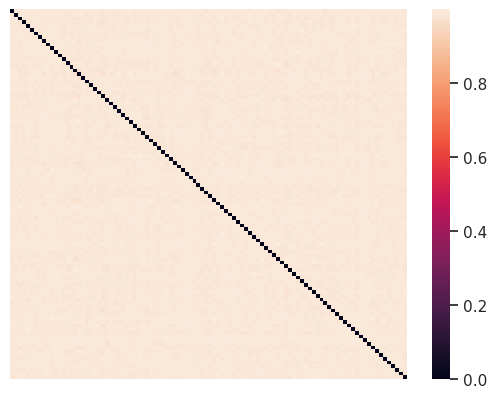

In [89]:
sns.heatmap(lcs_distances, xticklabels=False, yticklabels=False)

In [90]:
k = 6
y_pred_km_euc = KMeans(n_clusters=k).fit_predict(euclidean_distances)
y_pred_km_dtw = KMeans(n_clusters=k).fit_predict(dtw_distances)
y_pred_km_rmse = KMeans(n_clusters=k).fit_predict(rmse_distances)
y_pred_km_lcs = KMeans(n_clusters=k).fit_predict(lcs_distances)



In [91]:

y_pred_hac_euc = AgglomerativeClustering(n_clusters=k)\
                 .fit_predict(euclidean_distances)
y_pred_hac_dtw = AgglomerativeClustering(n_clusters=k).fit_predict(dtw_distances)
y_pred_hac_rmse = AgglomerativeClustering(n_clusters=k).fit_predict(rmse_distances)
y_pred_hac_lcs = AgglomerativeClustering(n_clusters=k).fit_predict(lcs_distances)



In [92]:
# True label normalisation
log_base = max(true_labels)**(1 / k) + 0.05
normalised_true_labels = [floor(log(l+1, log_base)) for l in sample_labels]



In [93]:
print('Normalized Mutual Information')
print('K-means + Eucledean: ', normalized_mutual_info_score(normalised_true_labels,
                                                            y_pred_km_euc))
print('K-means + RMS:       ', normalized_mutual_info_score(normalised_true_labels,
                                                            y_pred_km_rmse))
print('K-means + DTW:       ', normalized_mutual_info_score(normalised_true_labels,
                                                            y_pred_km_dtw))
print('K-means + LCSS:      ', normalized_mutual_info_score(normalised_true_labels,
                                                            y_pred_km_lcs))
print('HAC + Eucledean:     ', normalized_mutual_info_score(normalised_true_labels,
                                                            y_pred_hac_euc))
print('HAC + RMS:           ', normalized_mutual_info_score(normalised_true_labels,
                                                            y_pred_hac_rmse))
print('HAC + DTW:           ', normalized_mutual_info_score(normalised_true_labels,
                                                            y_pred_hac_dtw))
print('HAC + LCSS:          ', normalized_mutual_info_score(normalised_true_labels,
                                                            y_pred_hac_lcs))



Normalized Mutual Information
K-means + Eucledean:  0.10524819670999373
K-means + RMS:        0.11908088134890842
K-means + DTW:        0.0782433087911284
K-means + LCSS:       0.11225509701574224
HAC + Eucledean:      0.1104011547098067
HAC + RMS:            0.1104011547098067
HAC + DTW:            0.1795863600173272
HAC + LCSS:           0.12306178695782495


In [94]:
print('Adjusted Rand Index')
print('K-means + Eucledean:  ', adjusted_rand_score(normalised_true_labels,
                                                    y_pred_km_euc))
print('K-means + RMS:       ', adjusted_rand_score(normalised_true_labels,
                                                   y_pred_km_rmse))
print('K-means + DTW:       ', adjusted_rand_score(normalised_true_labels,
                                                   y_pred_km_dtw))
print('K-means + LCSS:       ', adjusted_rand_score(normalised_true_labels,
                                                    y_pred_km_lcs))
print('HAC + Eucledean:     ', adjusted_rand_score(normalised_true_labels,
                                                   y_pred_hac_euc))
print('HAC + RMS:           ', adjusted_rand_score(normalised_true_labels,
                                                   y_pred_hac_rmse))
print('HAC + DTW:           ', adjusted_rand_score(normalised_true_labels,
                                                   y_pred_hac_dtw))
print('HAC + LCSS:           ', adjusted_rand_score(normalised_true_labels,
                                                    y_pred_hac_lcs))


Adjusted Rand Index
K-means + Eucledean:   -0.011928880354453126
K-means + RMS:        0.0025903586497424006
K-means + DTW:        0.002273343069938342
K-means + LCSS:        0.014504424841828968
HAC + Eucledean:      -0.007432200932978415
HAC + RMS:            -0.007432200932978415
HAC + DTW:            0.045583713779931055
HAC + LCSS:            0.022370190024547345


<Axes: xlabel='0', ylabel='1'>

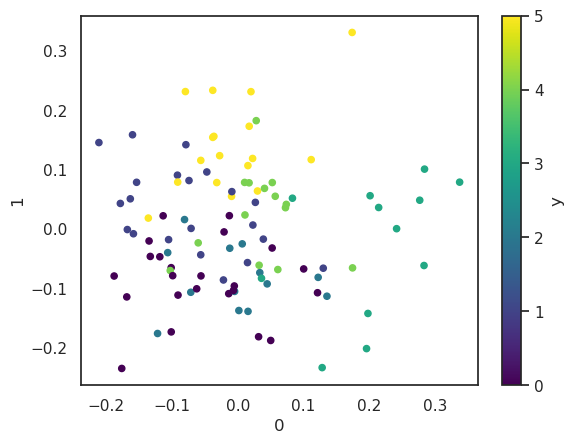

In [95]:
pca = PCA(n_components=2)
emb = pd.DataFrame(pca.fit_transform(lcs_distances))
emb['y'] = y_pred_hac_lcs
emb['gt'] = normalised_true_labels
emb.plot(kind='scatter', x=0, y=1, c='y', cmap='viridis')


In [97]:
# computeting features for a single chunk and sensor
def extract_featrues(chunk, s):
    column = chunk[s]
    slope = (column.iloc[-1]-column.iloc[0])/10
    return (column.std(), column.mean(), slope)

def compute_features_for_all_chunks(s):
    stds = []
    means = []
    slopes = []

    for chunk in sample:
        std, mean, slope = extract_featrues(chunk, s)
        stds.append(std)
        means.append(mean)
        slopes.append(slope)
    return pd.DataFrame({'std': stds, 'mean': means, 'slope': slopes,
                         'true_label': normalised_true_labels,
                         'cluster': y_pred_hac_lcs})



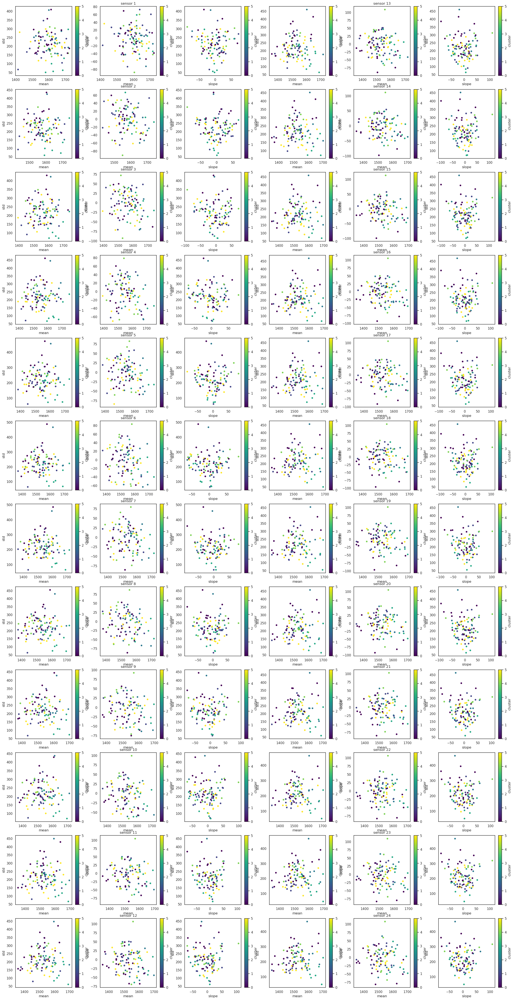

In [98]:
sensor_max = 25
sensor_min = 2

f, axis = plt.subplots(12, 6, figsize=(30,60))
for s in range(sensor_min, sensor_max+1):
    features = compute_features_for_all_chunks(s)
    row = (s-sensor_min)%12
    col = (s-sensor_min)//12
    features.plot(kind='scatter', x='mean', y='std', c='cluster',
                  cmap='viridis', ax=axis[row][col*3])
    features.plot(kind='scatter', x='mean', y='slope', c='cluster',
                  cmap='viridis', ax=axis[row][col*3+1])
    features.plot(kind='scatter', x='slope', y='std', c='cluster',
                  cmap='viridis', ax=axis[row][col*3+2])
    axis[row][col*3+1].set_title('sensor ' + str(s-sensor_min+1))



<Axes: xlabel='mean', ylabel='std'>

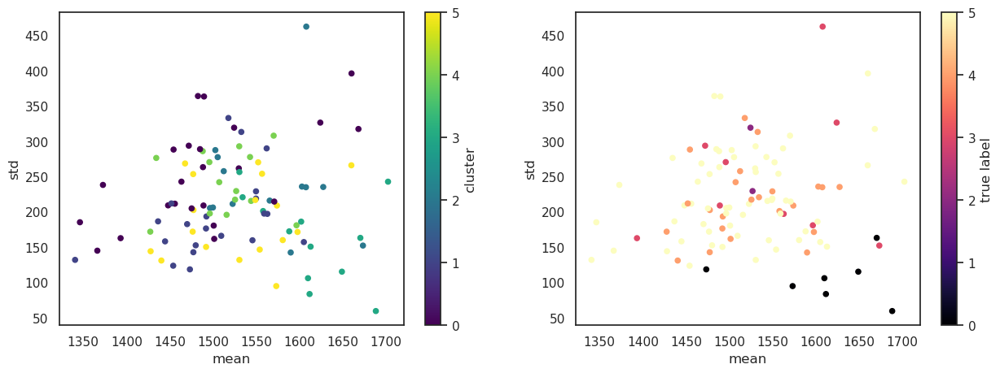

In [99]:
# sensor 22
# mean x std
f, axis = plt.subplots(1, 2, figsize=(15,5))
features = compute_features_for_all_chunks(22)
features.plot(kind='scatter', x='mean', y='std', c='cluster',
              cmap='viridis', ax=axis[0])
features['true label'] = normalised_true_labels
features.plot(kind='scatter', x='mean', y='std', c='true label',
              cmap='magma', ax=axis[1])


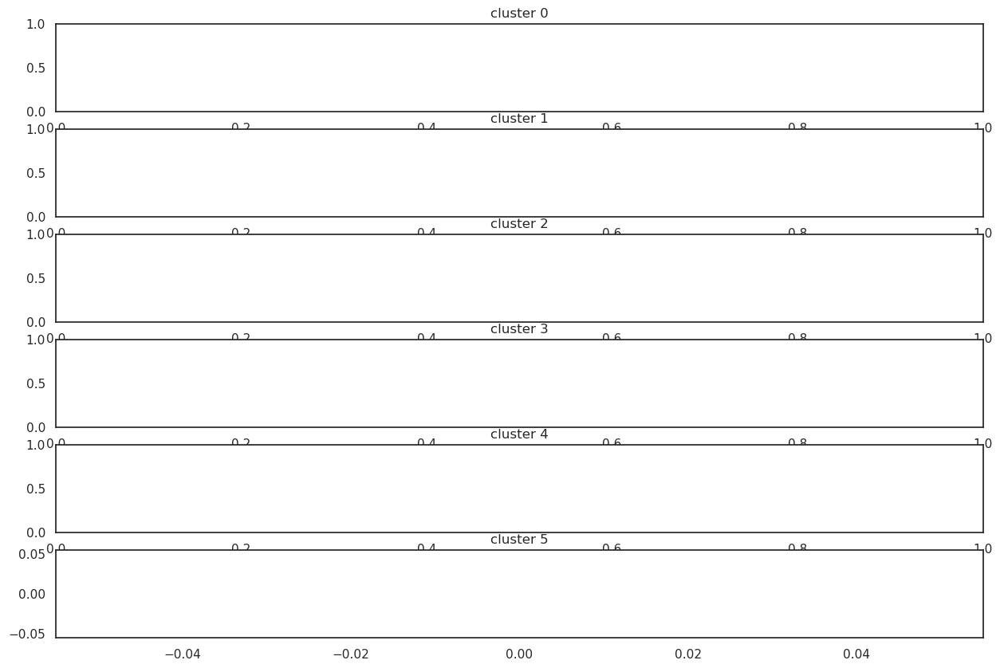

In [104]:
num_cluster = len(set(y_pred_hac_lcs))
sensor = 22

f, axis = plt.subplots(num_cluster, 1, figsize=(15, 10))
for c in range(num_cluster):
    index = y_pred_hac_dtw == c
    cluster_chunks = pd.DataFrame([chunk[sensor].reset_index(drop=True) 
                                   for chunk, flag in zip(sample, index)
                                   if flag])
    plt.plot(data=cluster_chunks, err_style='unit_traces', ax=axis[c])
    axis[c].set_title('cluster ' + str(c))


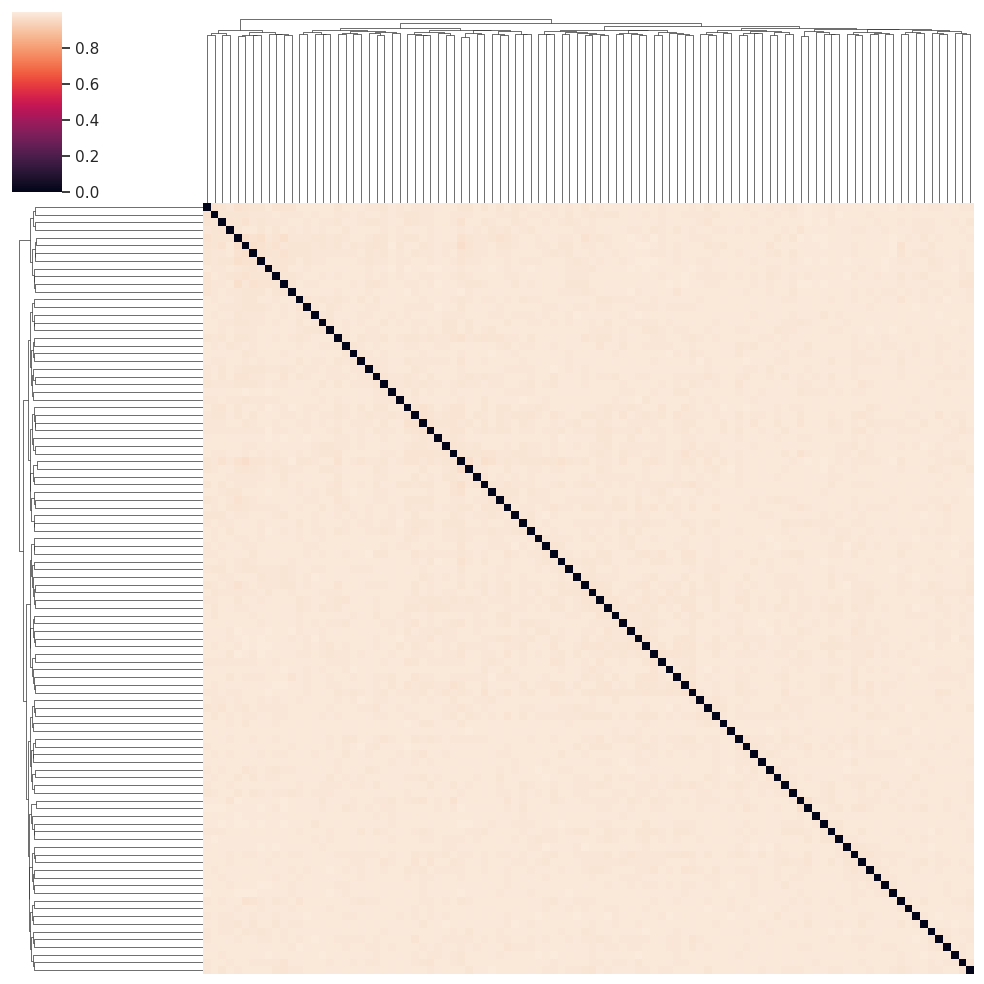

In [103]:
# compute linkage matrix for HAC clusters
links = scipy.cluster.hierarchy.linkage(lcs_distances, method='ward')
sns.clustermap(lcs_distances, xticklabels=False, yticklabels=False,
               method='ward', col_linkage=links, row_linkage=links)


100%|██████████| 20230/20230 [00:26<00:00, 759.27it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


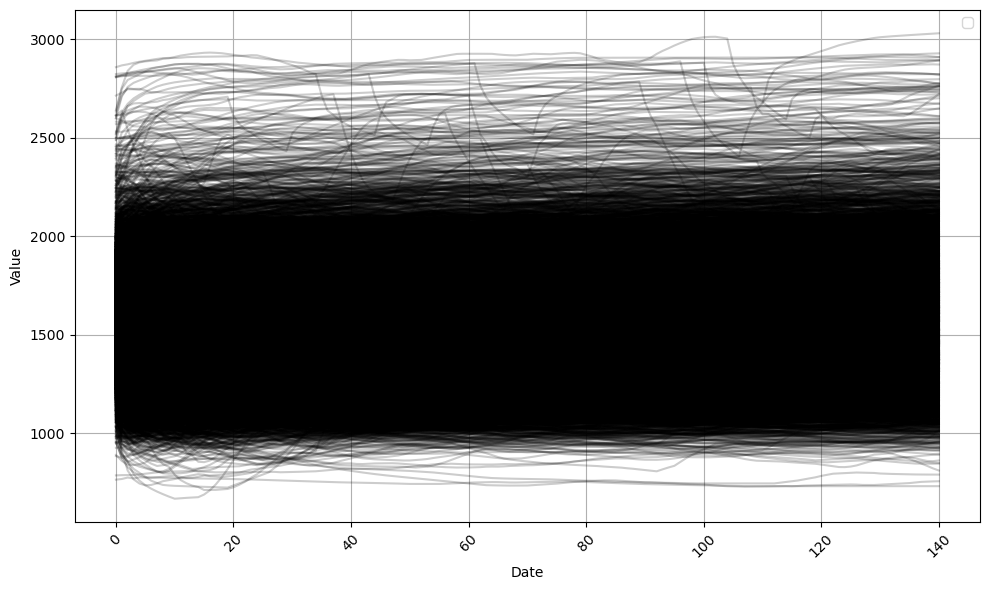

In [161]:
# Plotting
w=10
plt.figure(figsize=(10, 6))
plt.grid()
for p in tqdm(df.index):
    x=[i for i in range(0,150-w+1)]
    y=list(df[df.index==p].values)[0]
    ys=sliding_window(w,y)
    plt.plot(x, ys, 'k-',alpha=.2)

plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [191]:
extra_detail={
    'mean_s':[],
    'var_s':[],
    'std_s':[],
    'mean_m':[],
    'var_m':[],
    'std_m':[],
    'mean_l':[],
    'var_l':[],
    'std_l':[],
    'skew':[],

    'Player':[],
}
w=10
for p in list(df.index):
    c=list(df[df.index==p].values)
    extra_detail['Player'].append(p)

    s=list(df[df.index==p].values)[:w]
    m=list(df[df.index==p].values)[:w*2]

    extra_detail['mean_s'].append(np.mean(s))
    extra_detail['var_s'].append(np.var(s))
    extra_detail['std_s'].append(np.std(s))

    extra_detail['mean_m'].append(np.mean(m))
    extra_detail['var_m'].append(np.var(m))
    extra_detail['std_m'].append(np.std(m))

    l=list(df[df.index==p].values)[:w*4]
    extra_detail['mean_l'].append(np.mean(l))
    extra_detail['var_l'].append(np.var(l))
    extra_detail['std_l'].append(np.std(l))
    extra_detail['skew'].append(skew(df[df.index==p].values[0]))


extra_detail=pd.DataFrame.from_dict(extra_detail)

In [192]:
extra_detail

,mean_s,var_s,std_s,mean_m,var_m,std_m,mean_l,var_l,std_l,skew,Player
0,1433.633333,2449.672222,49.494164,1433.633333,2449.672222,49.494164,1433.633333,2449.672222,49.494164,-0.394265,edsvoboda
1,1308.660000,3798.491067,61.631900,1308.660000,3798.491067,61.631900,1308.660000,3798.491067,61.631900,-0.670292,tunretni
2,1376.993333,31057.259956,176.230701,1376.993333,31057.259956,176.230701,1376.993333,31057.259956,176.230701,-1.015684,seeadler
3,1467.506667,1851.676622,43.031112,1467.506667,1851.676622,43.031112,1467.506667,1851.676622,43.031112,1.580381,mrclyde
4,1524.400000,2455.240000,49.550378,1524.400000,2455.240000,49.550378,1524.400000,2455.240000,49.550378,1.537214,loveshore
...,...,...,...,...,...,...,...,...,...,...,...
20225,1685.133333,5957.675556,77.185980,1685.133333,5957.675556,77.185980,1685.133333,5957.675556,77.185980,-2.241806,naiscufa
20226,1482.480000,1738.369600,41.693760,1482.480000,1738.369600,41.693760,1482.480000,1738.369600,41.693760,1.033932,pablomatus
20227,1602.466667,3498.702222,59.149829,1602.466667,3498.702222,59.149829,1602.466667,3498.702222,59.149829,2.673920,jadugar
20228,1804.520000,1345.636267,36.682915,1804.520000,1345.636267,36.682915,1804.520000,1345.636267,36.682915,0.798342,dayuxiaoyu


In [196]:
sorted(extra_detail["skew"])

[-8.775614374400359,
 -8.380278352095246,
 -8.102952862005559,
 -8.042372279123505,
 -7.8523713968577145,
 -7.751774417294448,
 -7.283351831682383,
 -6.789200790751704,
 -6.742006154519411,
 -6.6220152286321365,
 -6.32992327364401,
 -6.179238196204218,
 -6.1537547186620305,
 -6.018084280086228,
 -5.994557614208063,
 -5.991264691481359,
 -5.97607331455407,
 -5.847379611704618,
 -5.640034451634761,
 -5.636990272340725,
 -5.597410259909215,
 -5.572484324185872,
 -5.472460851304062,
 -5.456559328961405,
 -5.441591964534864,
 -5.390697934618334,
 -5.354769225421151,
 -5.3282401555869985,
 -5.307245904209761,
 -5.290582241224816,
 -5.290015639693324,
 -5.264502028916923,
 -5.219612695509275,
 -5.160673135357935,
 -5.143136936897131,
 -5.0764643933024995,
 -5.072578313903645,
 -5.036539598093534,
 -5.010388173582179,
 -5.003851450716163,
 -4.97594499756994,
 -4.954872850710972,
 -4.937482765995507,
 -4.933654929696116,
 -4.908123905261835,
 -4.90151958235387,
 -4.897969935103242,
 -4.89627164

<Axes: xlabel='Letter'>

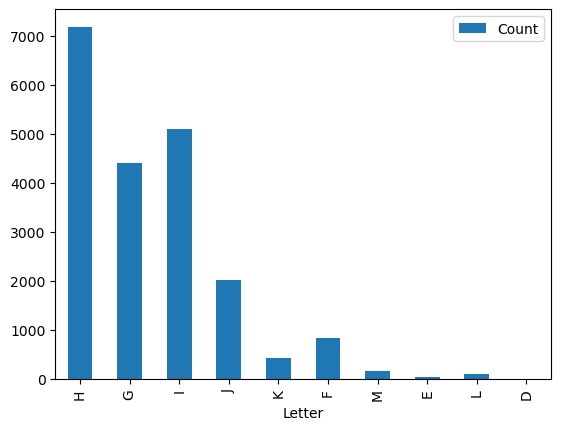

In [170]:
d=dict(Counter(extra_detail["mean_s"].apply(lambda r:get_grade_mapping(r))))
pd.DataFrame.from_dict({'Letter':list(d.keys()),'Count':list(d.values())}).plot.bar(x="Letter",y="Count")


<Axes: >

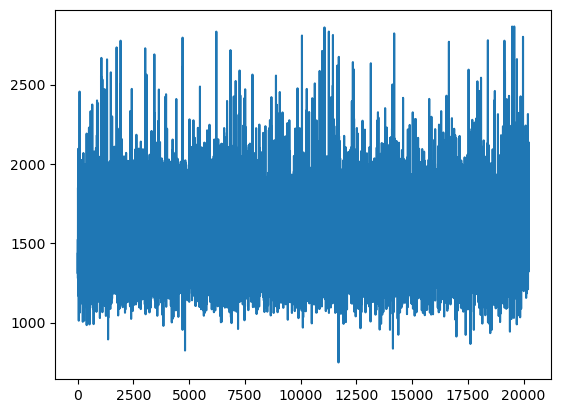

In [174]:
extra_detail["mean_s"].plot()

In [179]:
df['edsvoboda'].values()

,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
edsvoboda,1334,1387,1402,1401,1394,1407,1413,1417,1417,1417,...,1354,1364,1376,1369,1360,1372,1370,1365,1365,1358
tunretni,1505,1391,1425,1313,1233,1152,1231,1163,1229,1262,...,1362,1356,1364,1357,1361,1358,1350,1356,1367,1375
seeadler,1720,1788,1469,1516,1582,1615,1516,1525,1450,1414,...,988,977,967,982,997,1013,1029,1034,1053,1069
mrclyde,1720,1607,1444,1514,1380,1376,1460,1517,1531,1499,...,1539,1533,1543,1546,1549,1539,1532,1523,1531,1525
loveshore,1720,1457,1555,1675,1705,1658,1720,1680,1610,1625,...,1547,1535,1543,1532,1538,1533,1521,1515,1525,1513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
naiscufa,1720,1700,1585,1534,1427,1396,1390,1381,1441,1491,...,1713,1709,1700,1690,1688,1677,1678,1683,1689,1696
pablomatus,1720,1506,1309,1384,1445,1489,1527,1561,1588,1597,...,1490,1520,1488,1468,1499,1521,1498,1512,1494,1518
jadugar,1720,1791,1847,1920,1829,1686,1733,1763,1774,1730,...,1601,1614,1622,1628,1619,1621,1628,1629,1624,1625
dayuxiaoyu,1720,1878,1738,1841,1894,1929,1910,1857,1898,1898,...,1826,1835,1842,1856,1857,1840,1845,1850,1844,1827


In [1]:
y=extra_detail.drop(columns=["Player"])

NameError: name 'extra_detail' is not defined

<Axes: xlabel='0', ylabel='2'>

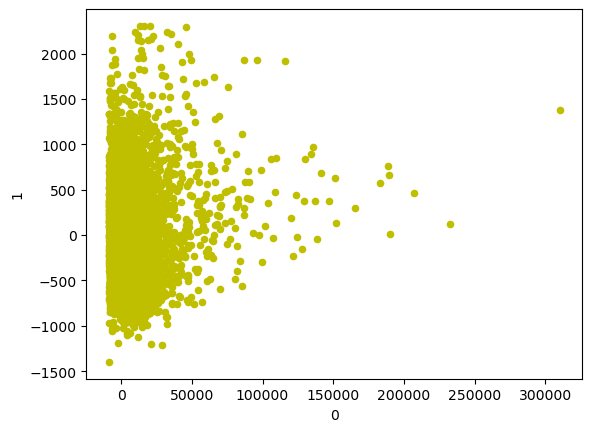

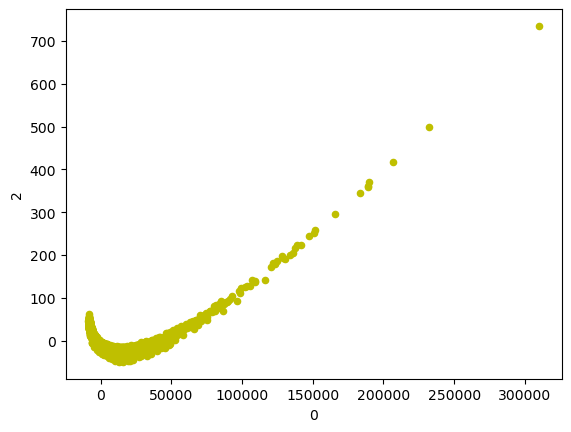

In [205]:
from sklearn.decomposition import PCA


pca = PCA(n_components=4)
emb = pd.DataFrame(pca.fit_transform(y))
emb.plot(kind='scatter', x=0, y=1, c='y', cmap='viridis')
emb.plot(kind='scatter', x=0, y=2, c='y', cmap='viridis')


In [183]:
df[df.index=='pablomatus'].values

AttributeError: 'numpy.ndarray' object has no attribute 'skew'

In [187]:
from scipy.stats import skew

# Generate synthetic time series data
np.random.seed(42)  # For reproducibility
ts1 = df[df.index=='edsvoboda'].values[0]
ts2 = df[df.index=='pablomatus'].values[0]
ts3 = df[df.index=='MrEuroman'].values[0]

# Calculate skewness for each time series
skewness_ts1 = skew(ts1)
skewness_ts2 = skew(ts2)
skewness_ts3 = skew(ts3)
print(ts1)
print(skewness_ts1)
# # Classification criteria
# right_skewed = []
# left_skewed = []
# symmetric = []

# # Classify based on skewness
# for ts, skewness in zip(['TS1', 'TS2', 'TS3'], [skewness_ts1, skewness_ts2, skewness_ts3]):
#     if skewness > 0.5:
#         right_skewed.append(ts)
#     elif skewness < -0.5:
#         left_skewed.append(ts)
#     else:
#         symmetric.append(ts)

# (right_skewed, left_skewed, symmetric), (skewness_ts1, skewness_ts2, skewness_ts3)


[1334 1387 1402 1401 1394 1407 1413 1417 1417 1417 1423 1425 1437 1449
 1450 1454 1470 1460 1475 1477 1480 1496 1485 1490 1481 1471 1471 1463
 1470 1476 1484 1488 1486 1480 1465 1476 1485 1474 1477 1492 1493 1488
 1473 1478 1465 1470 1459 1453 1441 1449 1432 1416 1426 1431 1422 1415
 1413 1423 1432 1441 1447 1441 1446 1450 1458 1462 1469 1475 1481 1487
 1493 1498 1482 1471 1489 1500 1515 1504 1511 1503 1515 1503 1501 1513
 1488 1488 1507 1479 1462 1483 1473 1475 1458 1437 1451 1436 1421 1442
 1427 1411 1423 1427 1417 1429 1429 1413 1413 1427 1414 1426 1435 1446
 1435 1425 1416 1407 1396 1391 1384 1375 1381 1381 1372 1362 1371 1364
 1362 1368 1365 1357 1348 1355 1346 1340 1335 1327 1335 1331 1339 1354
 1354 1364 1376 1369 1360 1372 1370 1365 1365 1358]
-0.39426453806488904


<Axes: >

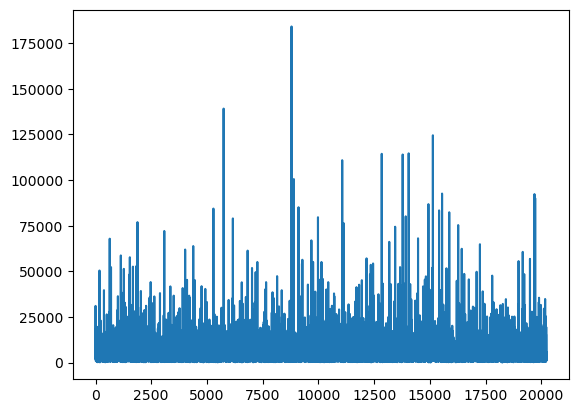

In [175]:
extra_detail["var_s"].plot()

<Axes: >

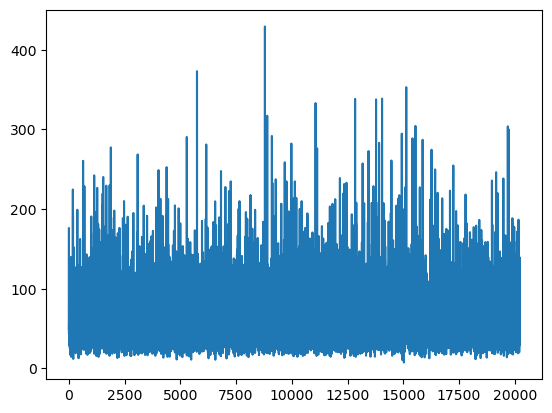

In [176]:
extra_detail["std_s"].plot()

<Axes: xlabel='Letter'>

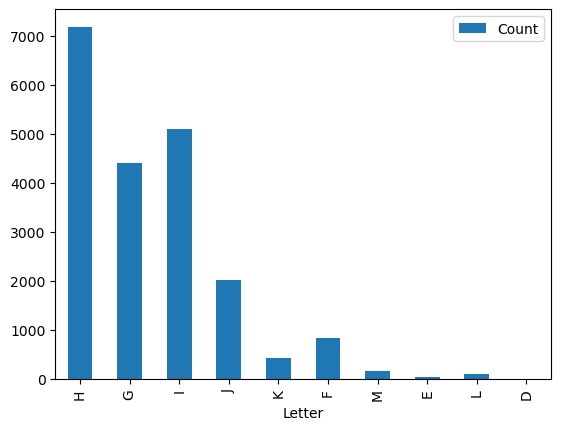

In [171]:
d=dict(Counter(extra_detail["mean_m"].apply(lambda r:get_grade_mapping(r))))
pd.DataFrame.from_dict({'Letter':list(d.keys()),'Count':list(d.values())}).plot.bar(x="Letter",y="Count")

<Axes: xlabel='Letter'>

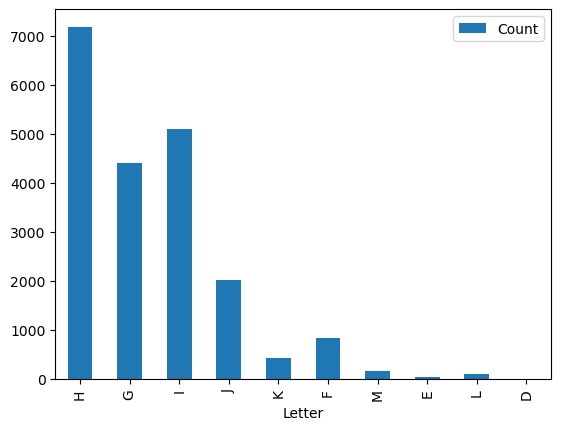

In [173]:
d=dict(Counter(extra_detail["mean_l"].apply(lambda r:get_grade_mapping(r))))
pd.DataFrame.from_dict({'Letter':list(d.keys()),'Count':list(d.values())}).plot.bar(x="Letter",y="Count")

In [103]:
from collections import Counter

<Axes: xlabel='Letter'>

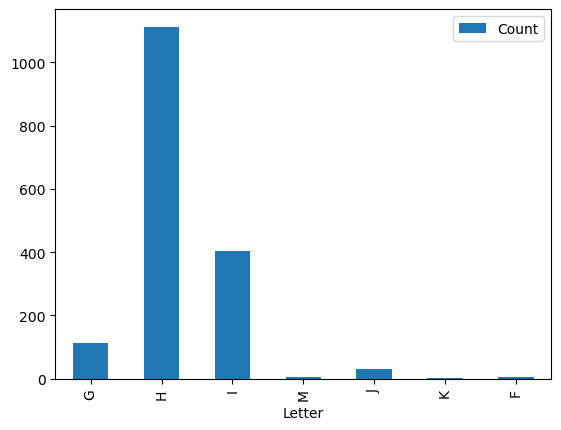

In [112]:
d=dict(Counter(extra_detail["mean"].apply(lambda r:get_grade_mapping(r))))
pd.DataFrame.from_dict({'Letter':list(d.keys()),'Count':list(d.values())}).plot.bar(x="Letter",y="Count")

In [37]:
players=list(h["Player"])
h.index=players
h=h.drop(columns="Player")


In [211]:
df=h

In [212]:
df

,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
tunretni,1505,1391,1425,1313,1233,1152,1231,1163,1229,1262,...,1362,1356,1364,1357,1361,1358,1350,1356,1367,1375
Ajnabee,1435,1433,1428,1481,1490,1475,1509,1464,1465,1453,...,1411,1420,1432,1419,1416,1425,1425,1425,1431,1436
SuperTony,1465,1688,1632,1567,1524,1541,1560,1606,1585,1576,...,1517,1524,1532,1536,1525,1526,1527,1518,1508,1519
metoo,1592,1592,1685,1717,1571,1507,1591,1662,1602,1557,...,1485,1495,1488,1481,1491,1484,1478,1470,1476,1485
drylogic,1576,1637,1526,1555,1577,1595,1609,1537,1478,1503,...,1251,1248,1247,1244,1238,1236,1232,1230,1226,1221
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
pedrodeg,1531,1407,1480,1569,1547,1525,1525,1484,1447,1407,...,1616,1548,1509,1533,1490,1496,1502,1510,1471,1498
pawntodfour,1520,1534,1547,1501,1381,1464,1512,1560,1592,1541,...,1618,1624,1631,1640,1632,1623,1629,1634,1627,1634
clcprodigy,1505,1500,1494,1505,1517,1510,1504,1500,1508,1509,...,1484,1491,1499,1512,1504,1499,1508,1499,1503,1495
Collibri,1480,1514,1510,1505,1516,1530,1540,1547,1536,1547,...,1512,1518,1516,1520,1515,1510,1504,1500,1504,1509


In [40]:

# Standardizing (z-score normalization) a dataset involves rescaling the distribution of values
ss = StandardScaler()

scaled_ss = ss.fit_transform(df.T)
df_ss = pd.DataFrame(scaled_ss.T, columns=df.columns, index=df.index)
X_ss = df_ss.values
display(df_ss.head())

# Normalization
mm = MinMaxScaler()
scaled_mm = mm.fit_transform(df.T)
df_mm = pd.DataFrame(scaled_mm.T, columns=df.columns, index=df.index)
X_mm = df_mm.values
display(df_mm.head())


# convert dataframe to time_series_dataset
X = to_time_series_dataset(df.values)

# normalize time series to zero mean and unit variance
X_train = TimeSeriesScalerMeanVariance().fit_transform(X)

print(X.shape, X_train.shape)

,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
tunretni,3.185688,1.335996,1.887659,0.070418,-1.227611,-2.541866,-1.260062,-2.363387,-1.292512,-0.757075,...,0.865461,0.768109,0.897912,0.784334,0.849236,0.800559,0.670757,0.768109,0.946588,1.076391
Ajnabee,0.416154,0.374566,0.270597,1.372671,1.559815,1.247908,1.954898,1.019175,1.039969,0.790443,...,-0.082898,0.104246,0.353773,0.083453,0.021071,0.208216,0.208216,0.208216,0.332979,0.436948
SuperTony,-2.505096,3.818613,2.230596,0.387363,-0.832007,-0.349931,0.188861,1.493303,0.897797,0.642580,...,-1.030509,-0.832007,-0.605148,-0.491718,-0.803650,-0.775292,-0.746935,-1.002152,-1.285726,-0.973794
metoo,0.942377,0.942377,2.893715,3.565143,0.501753,-0.841103,0.921395,2.411126,1.152198,0.208003,...,-1.302710,-1.092889,-1.239764,-1.386639,-1.176817,-1.323692,-1.449585,-1.617442,-1.491549,-1.302710
drylogic,2.615831,3.324487,2.034965,2.371867,2.627448,2.836560,2.999202,2.162756,1.477335,1.767767,...,-1.159795,-1.194647,-1.206264,-1.241116,-1.310820,-1.334054,-1.380524,-1.403758,-1.450228,-1.508314


,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
tunretni,1.000000,0.680672,0.775910,0.462185,0.238095,0.011204,0.232493,0.042017,0.226891,0.319328,...,0.599440,0.582633,0.605042,0.585434,0.596639,0.588235,0.565826,0.582633,0.613445,0.635854
Ajnabee,0.537634,0.526882,0.500000,0.784946,0.833333,0.752688,0.935484,0.693548,0.698925,0.634409,...,0.408602,0.456989,0.521505,0.451613,0.435484,0.483871,0.483871,0.483871,0.516129,0.543011
SuperTony,0.000000,1.000000,0.748879,0.457399,0.264574,0.340807,0.426009,0.632287,0.538117,0.497758,...,0.233184,0.264574,0.300448,0.318386,0.269058,0.273543,0.278027,0.237668,0.192825,0.242152
metoo,0.509804,0.509804,0.874510,1.000000,0.427451,0.176471,0.505882,0.784314,0.549020,0.372549,...,0.090196,0.129412,0.101961,0.074510,0.113725,0.086275,0.062745,0.031373,0.054902,0.090196
drylogic,0.853365,1.000000,0.733173,0.802885,0.855769,0.899038,0.932692,0.759615,0.617788,0.677885,...,0.072115,0.064904,0.062500,0.055288,0.040865,0.036058,0.026442,0.021635,0.012019,0.000000


(1675, 150, 1) (1675, 150, 1)


In [56]:
wcss=kmeans_calinski_harabasz(X_train,"euclidean",f"kmeans_euclidean_150_v2",3)

ValueError: Found array with dim 3. None expected <= 2.

In [206]:
len(X_train[0])

150

In [210]:
len(X_train)

1675

In [207]:
wcss=kmeans_wcsss(X_train,"dtw",f"kmeans_dtw_150",20)

26.64529864900603
K = 2. Took 120.59 seconds to calculate.


KeyboardInterrupt: 

In [64]:
# Set a seed for reproducibility
seed = 0
np.random.seed(seed)
# Set the number of clusters
n_clusters = 4
from tslearn.datasets import CachedDatasets
# Resampling: Make time series shorter

# clustering algorithms
clustering_algorithms = {
    # 'kshape':KShape(n_clusters=n_clusters, max_iter=10, n_init=2),
    # 'kernelkmeans':KernelKMeans(n_clusters=n_clusters, kernel="gak", max_iter=5, n_init=2),
}


best_algorithm = None
best_score = float("-inf")

# Iterate through each clustering algorithm
for algorithm_name, algorithm in clustering_algorithms.items():
    print(algorithm_name)
    # Apply the current clustering algorithm
    y_pred = algorithm.fit_predict(X_train)
    # Evaluate the clustering performance using silhouette score
    score = silhouette_score(X_train, y_pred)

    print(f"{algorithm_name} - Silhouette Score: {score}")

    # Check if the current algorithm has a higher silhouette score
    if score > best_score:
        best_score = score
        best_algorithm = algorithm_name

# Print the best clustering algorithm
print(f"The best clustering algorithm is: {best_algorithm} with Silhouette Score: {best_score}")

KMeans
KMeans - Silhouette Score: 0.09232321736694993
dtw
dtw - Silhouette Score: 0.15446718344254823
softdtw
softdtw - Silhouette Score: 0.09964993101705849
The best clustering algorithm is: dtw with Silhouette Score: 0.15446718344254823


In [ ]:
labels=kmeans_cluster(4,f"kmeans_euclidean_150_v2",X_train,"euclidean")

In [126]:
with open(f"{PROJECT_PATH}/data/fics/interim/modified_elo_v2.pkl", 'rb') as f:
    modified_elo=pickle.load( f)

In [128]:
players=list(modified_elo.keys())

dict_keys(['edsvoboda', 'tunretni', 'seeadler', 'mrclyde', 'loveshore', 'cdtpulsemed', 'rsagaseta', 'zippycorn', 'ZLeonardo', 'awesometoo', 'docjtr', 'Ajnabee', 'gavrosh', 'rocco', 'dadop', 'udicuty', 'MALEFACTER', 'ceolfrith', 'Sethar', 'KdZz', 'Kknox', 'Molka', 'heleijele', 'derustzelve', 'SuperTony', 'locco', 'GonzalesZS', 'OmarJacinto', 'ramakos', 'metoo', 'umbeebmu', 'Saebelzahntiger', 'thefourthhorseman', 'SmallCheese', 'Sergyksi', 'plamb', 'anistar', 'Largadon', 'strigospegul', 'drylogic', 'Athal', 'tonoticeran', 'CloneHat', 'seriouslyaddicted', 'rntjr', 'MiloBot', 'teddyDee', 'TheLeader', 'Gholij', 'EDVSR', 'bronkocz', 'noahtoe', 'Pizaa', 'Odigidy', 'Sulvedin', 'FanshiMausu', 'louarn', 'SondreM', 'kirya', 'Chindhya', 'ashtar', 'tyumen', 'StoicForm', 'leonardoan', 'aeroporos', 'reroiatti', 'howdyfolks', 'abadjm', 'Bondesliga', 'ChessMethOde', 'abxd', 'ironsfan', 'Buriag', 'Arnoldus', 'MrCooke', 'stasyepinin', 'rollingrooks', 'anoniolorenzo', 'matsmats', 'StefanMen', 'coffeefreak

In [132]:
df=pd.DataFrame.from_dict(modified_elo)

'<' not supported between instances of 'builtin_function_or_method' and 'int'
'<' not supported between instances of 'builtin_function_or_method' and 'int'
'<' not supported between instances of 'builtin_function_or_method' and 'int'
'<' not supported between instances of 'builtin_function_or_method' and 'int'
'<' not supported between instances of 'builtin_function_or_method' and 'int'
'<' not supported between instances of 'builtin_function_or_method' and 'int'
'<' not supported between instances of 'builtin_function_or_method' and 'int'
'<' not supported between instances of 'builtin_function_or_method' and 'int'
'<' not supported between instances of 'builtin_function_or_method' and 'int'
'<' not supported between instances of 'builtin_function_or_method' and 'int'
'<' not supported between instances of 'builtin_function_or_method' and 'int'
'<' not supported between instances of 'builtin_function_or_method' and 'int'
'<' not supported between instances of 'builtin_function_or_meth

{}

In [134]:
df=df[df.index==0]

In [137]:
df=df.T

In [161]:
df[0]=df[0].apply(lambda r:r[:151])
df[1]=df[0].apply(lambda r:len(r)>=150)


In [163]:
df=df[df[1]==True]

In [164]:
X=df.explode(0)

In [167]:
X=X.drop(columns=1)

In [170]:
X

,0
tunretni,1159
tunretni,1185
tunretni,1185
tunretni,1185
tunretni,1148
...,...
pablomatus,1495
pablomatus,1495
pablomatus,1521
pablomatus,1529


In [175]:
for X

,0
tunretni,1159
tunretni,1185
tunretni,1185
tunretni,1185
tunretni,1148
...,...
pablomatus,1495
pablomatus,1495
pablomatus,1521
pablomatus,1529


In [155]:
print(X[X.index=="dayuxiaoyu"].values)


[[1765]
 [1766]
 [1752]
 [1752]
 [1771]
 [1771]
 [1758]
 [1786]
 [1784]
 [1805]
 [1796]
 [1805]
 [1792]
 [1812]
 [1818]
 [1810]
 [1814]
 [1817]
 [1816]
 [1842]
 [1842]
 [1856]
 [1850]
 [1827]
 [1843]
 [1839]
 [1838]
 [1846]
 [1857]
 [1840]
 [1833]
 [1839]
 [1839]
 [1839]
 [1839]
 [1839]
 [1796]
 [1785]
 [1788]
 [1797]
 [1794]
 [1785]
 [1788]
 [1795]
 [1816]
 [1822]
 [1828]
 [1858]
 [1848]
 [1835]
 [1826]
 [1839]
 [1839]
 [1839]
 [1839]
 [1825]
 [1820]
 [1856]
 [1872]
 [1838]
 [1838]
 [1838]
 [1828]
 [1819]
 [1786]
 [1786]
 [1786]
 [1786]
 [1808]
 [1808]
 [1860]
 [1869]
 [1881]
 [1881]
 [1881]
 [1881]
 [1881]
 [1881]
 [1860]
 [1874]
 [1902]
 [1864]
 [1864]
 [1864]
 [1864]
 [1864]
 [1822]
 [1843]
 [1848]]


In [183]:
fixed={"Player":[]}
for i in range(0,58):
    fixed[i]=[]
for p in list(set(X.index)):
    rows=list(X[X.index==p].values)
    rows=[r[0] for r in rows]
    bad=False
    for i in range(0,58):
        try:
            fixed[i].append(rows[i])
        except Exception as err:
            bad=True
    if not bad:            
        fixed["Player"].append(p)


fixed_df=pd.DataFrame.from_dict(fixed)

In [184]:
fixed_df.to_csv("test.csv")

In [202]:
h=fixed_df

In [212]:
df=h.T

In [195]:
players=df.T["Player"]

In [214]:
df=df.T

In [215]:
df.index=list(players)

In [217]:
df=df.drop(columns=["Player"])

In [218]:
df

,0,1,2,3,4,5,6,7,8,9,...,48,49,50,51,52,53,54,55,56,57
MPSPB,1659,1678,1638,1661,1627,1627,1627,1619,1647,1624,...,1691,1698,1698,1718,1699,1699,1699,1699,1699,1699
subcutaneo,1717,1673,1709,1678,1658,1646,1644,1625,1624,1624,...,1630,1531,1504,1527,1527,1527,1541,1574,1555,1551
hemantdhawan,1336,1396,1396,1349,1349,1349,1343,1343,1343,1343,...,1385,1385,1385,1385,1385,1385,1353,1363,1374,1376
lostpawns,1671,1677,1683,1683,1683,1683,1654,1633,1705,1711,...,1776,1776,1776,1776,1776,1776,1776,1776,1776,1776
GlaurungC,2546,2519,2519,2519,2519,2527,2527,2527,2527,2527,...,2529,2529,2548,2548,2563,2563,2575,2575,2566,2566
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
chessraj,1210,1280,1295,1331,1380,1391,1390,1388,1407,1398,...,1371,1371,1371,1371,1371,1371,1371,1371,1371,1371
ldrucifer,1753,1820,1874,1850,1843,1841,1841,1864,1860,1868,...,1837,1837,1837,1837,1837,1837,1837,1837,1837,1837
MChessplayer,1302,1335,1356,1349,1305,1316,1323,1365,1373,1387,...,1515,1535,1547,1533,1498,1511,1477,1547,1536,1506
chessmassive,1704,1663,1638,1654,1639,1611,1602,1608,1613,1601,...,1619,1619,1619,1619,1619,1619,1630,1602,1598,1556


In [219]:

# Standardizing (z-score normalization) a dataset involves rescaling the distribution of values
ss = StandardScaler()

scaled_ss = ss.fit_transform(df.T)
df_ss = pd.DataFrame(scaled_ss.T, columns=df.columns, index=df.index)
X_ss = df_ss.values
display(df_ss.head())

# Normalization
mm = MinMaxScaler()
scaled_mm = mm.fit_transform(df.T)
df_mm = pd.DataFrame(scaled_mm.T, columns=df.columns, index=df.index)
X_mm = df_mm.values
display(df_mm.head())


# convert dataframe to time_series_dataset
X = to_time_series_dataset(df.values)

# normalize time series to zero mean and unit variance
X_train = TimeSeriesScalerMeanVariance().fit_transform(X)

print(X.shape, X_train.shape)

,0,1,2,3,4,5,6,7,8,9,...,48,49,50,51,52,53,54,55,56,57
MPSPB,0.117789,0.584709,-0.398280,0.166939,-0.668603,-0.668603,-0.668603,-0.865200,-0.177108,-0.742327,...,0.904181,1.076204,1.076204,1.567699,1.100779,1.100779,1.100779,1.100779,1.100779,1.100779
subcutaneo,1.460410,0.639673,1.311185,0.732939,0.359876,0.136039,0.098733,-0.255676,-0.274329,-0.274329,...,-0.162411,-2.009069,-2.512703,-2.083682,-2.083682,-2.083682,-1.822538,-1.206985,-1.561394,-1.636007
hemantdhawan,-1.174121,0.426326,0.426326,-0.827357,-0.827357,-0.827357,-0.987402,-0.987402,-0.987402,-0.987402,...,0.132911,0.132911,0.132911,0.132911,0.132911,0.132911,-0.720661,-0.453920,-0.160505,-0.107156
lostpawns,-2.196860,-2.040327,-1.883794,-1.883794,-1.883794,-1.883794,-2.640370,-3.188235,-1.309839,-1.153306,...,0.542468,0.542468,0.542468,0.542468,0.542468,0.542468,0.542468,0.542468,0.542468,0.542468
GlaurungC,0.799892,-0.760047,-0.760047,-0.760047,-0.760047,-0.297843,-0.297843,-0.297843,-0.297843,-0.297843,...,-0.182292,-0.182292,0.915444,0.915444,1.782077,1.782077,2.475383,2.475383,1.955403,1.955403


,0,1,2,3,4,5,6,7,8,9,...,48,49,50,51,52,53,54,55,56,57
MPSPB,0.662857,0.771429,0.542857,0.674286,0.480000,0.480000,0.480000,0.434286,0.594286,0.462857,...,0.845714,0.885714,0.885714,1.000000,0.891429,0.891429,0.891429,0.891429,0.891429,0.891429
subcutaneo,1.000000,0.793427,0.962441,0.816901,0.723005,0.666667,0.657277,0.568075,0.563380,0.563380,...,0.591549,0.126761,0.000000,0.107981,0.107981,0.107981,0.173709,0.328638,0.239437,0.220657
hemantdhawan,0.056995,0.367876,0.367876,0.124352,0.124352,0.124352,0.093264,0.093264,0.093264,0.093264,...,0.310881,0.310881,0.310881,0.310881,0.310881,0.310881,0.145078,0.196891,0.253886,0.264249
lostpawns,0.251656,0.291391,0.331126,0.331126,0.331126,0.331126,0.139073,0.000000,0.476821,0.516556,...,0.947020,0.947020,0.947020,0.947020,0.947020,0.947020,0.947020,0.947020,0.947020,0.947020
GlaurungC,0.508475,0.050847,0.050847,0.050847,0.050847,0.186441,0.186441,0.186441,0.186441,0.186441,...,0.220339,0.220339,0.542373,0.542373,0.796610,0.796610,1.000000,1.000000,0.847458,0.847458


(10146, 58, 1) (10146, 58, 1)


1317290.1766576506
K = 2. Took 5.59 seconds to calculate.
809344.0484703695
K = 3. Took 6.21 seconds to calculate.
578820.7825072642
K = 4. Took 8.82 seconds to calculate.
437010.8597219777
K = 5. Took 9.01 seconds to calculate.
352203.68651292264
K = 6. Took 8.99 seconds to calculate.
302667.66846985125
K = 7. Took 11.62 seconds to calculate.
268441.25681671436
K = 8. Took 12.00 seconds to calculate.
259635.74981183553
K = 9. Took 11.52 seconds to calculate.
234100.76473119197
K = 10. Took 12.56 seconds to calculate.
216148.5722567238
K = 11. Took 12.39 seconds to calculate.
203041.83738140954
K = 12. Took 5.87 seconds to calculate.
191698.62885843104
K = 13. Took 12.71 seconds to calculate.
186290.18218008566
K = 14. Took 12.47 seconds to calculate.
178367.06541765918
K = 15. Took 11.94 seconds to calculate.
172777.80872027483
K = 16. Took 11.87 seconds to calculate.
167647.44098540492
K = 17. Took 12.34 seconds to calculate.
164171.9762874189
K = 18. Took 11.72 seconds to calculate.

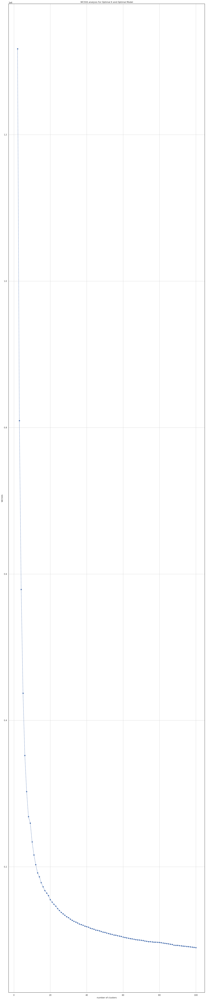

In [233]:
wcss=kmeans_wcsss(X,"euclidean",f"kmeans_euclsidean_150",100)

In [229]:
def kmeans_wcsss_2(X_train,metric,model_name,min_k,max_k=10):
    wcss = []
    for i in range(min_k,max_k+1,10):
        start = time.time()
        model= TimeSeriesKMeans(n_clusters=i,metric=metric,n_jobs=-1,random_state=0)
        model.fit_predict(X_train)
        print(model.inertia_)
        wcss.append(model.inertia_)
        stop = time.time()
        duration = stop - start
        print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")

    plt.figure(figsize=(20,max_k+1))
    plt.grid()
    plt.plot(range(2,max_k+1-min_k),wcss,marker='o',linestyle='--')
    plt.xlabel('number of clusters')
    plt.ylabel('WCSSS');
    plt.title("WCSSS analysis For Optimal K and Optimal Model")
    plt.savefig(f"{PROJECT_PATH}/reports/figures/fics/kmeans-wcsss-plot-{model_name}_v2.png")

    return wcss


In [232]:
wcss=kmeans_wcsss_2(X_train,"euclidean",f"kmeans_euclsideaxn_150",200,1000)

19.26968077637144
K = 200. Took 15.56 seconds to calculate.
19.14108111117304
K = 210. Took 11.83 seconds to calculate.
19.010714797029248
K = 220. Took 11.39 seconds to calculate.
18.91075332005615
K = 230. Took 7.68 seconds to calculate.
18.760242804370318
K = 240. Took 8.06 seconds to calculate.
18.63815638378565
K = 250. Took 10.59 seconds to calculate.
18.544278938874807
K = 260. Took 13.16 seconds to calculate.
18.42291202090549
K = 270. Took 12.39 seconds to calculate.
18.316534072530196
K = 280. Took 13.59 seconds to calculate.
18.186914434408816
K = 290. Took 2841.01 seconds to calculate.
18.102817992993064
K = 300. Took 9.30 seconds to calculate.
17.994153428212616
K = 310. Took 8.16 seconds to calculate.
17.891005979394127
K = 320. Took 14.75 seconds to calculate.
17.84685204633515
K = 330. Took 7.61 seconds to calculate.
17.774381979373494
K = 340. Took 9.14 seconds to calculate.
17.703661457528334
K = 350. Took 9.43 seconds to calculate.
17.61587166086708
K = 360. Took 7.7

ValueError: x and y must have same first dimension, but have shapes (799,) and (81,)

Error in callback <function _draw_all_if_interactive at 0x75411eeaa2a0> (for post_execute), with arguments args (),kwargs {}:


ValueError: Image size of 2000x100100 pixels is too large. It must be less than 2^16 in each direction.

ValueError: Image size of 2000x100100 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 2000x100100 with 1 Axes>

In [230]:
wcss=kmeans_wcsss(X_train,"euclidean",f"kmeans_euclsidean_150",100)

42.36564176707413
K = 2. Took 3.38 seconds to calculate.


KeyboardInterrupt: 

In [234]:
X

array([[[1659.],
        [1678.],
        [1638.],
        ...,
        [1699.],
        [1699.],
        [1699.]],

       [[1717.],
        [1673.],
        [1709.],
        ...,
        [1574.],
        [1555.],
        [1551.]],

       [[1336.],
        [1396.],
        [1396.],
        ...,
        [1363.],
        [1374.],
        [1376.]],

       ...,

       [[1302.],
        [1335.],
        [1356.],
        ...,
        [1547.],
        [1536.],
        [1506.]],

       [[1704.],
        [1663.],
        [1638.],
        ...,
        [1602.],
        [1598.],
        [1556.]],

       [[1398.],
        [1444.],
        [1444.],
        ...,
        [1422.],
        [1429.],
        [1429.]]])

In [235]:
from scipy.spatial import distance

# Example time series data
time_series_1 = [1, 2, 3, 4, 5]
time_series_2 = [2, 3, 4, 5, 6]

# Calculate Euclidean distance
distance = distance.euclidean(time_series_1, time_series_2)
print("Euclidean Distance:", distance)

Euclidean Distance: 2.23606797749979


In [236]:
!pip install dtaidistance

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.0/9.0 MB 9.8 MB/s eta 0:00:00:00:010:010m
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for dtaidistance: filename=dtaidistance-2.3.11-cp311-cp311-linux_x86_64.whl size=1312136 sha256=b7d86467a93de35f01b855cde7a525294d49a75dacc1b2490ef55e183b8bfaa4
  Stored in directory: /home/ariel/.cache/pip/wheels/30/d0/5e/320285d2c704a2ccfe038e2d3e3ffba414dcda5170de16e5ff
Successfully built dtaidistance


In [237]:
from dtaidistance import dtw
import numpy as np


In [241]:
len(X)

10146

In [243]:
d=dtw.distance(X[0], X[1])
index=1
for i in range(1,len(X)):
    distance = dtw.distance(X[0], X[i])
    if distance<d:
        d=distance
        index=i

d,index

(102.41093691593686, 7003)